# Exploring the HOPE survey

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import warnings

sns.set_theme(style='whitegrid', font='fira sans')
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

## Loading and pre-processing data

In [2]:
DATA_STATA_PATH   = 'hope_data/EWS_0326_klar.dta'      # Original data
DATA_PARQUET_PATH = 'hope_data/EWS_0326_klar.parquet'  # Pre-processed data

In [3]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    meta = pd.read_stata(DATA_STATA_PATH, iterator=True)
    ANSWERS_META   = meta.value_labels()
    QUESTIONS_META = meta.variable_labels()

In [4]:
def preprocess_stata(path):
    # Loading data
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        df = pd.read_stata(path, convert_categoricals=False)
    
    # Handling categorical data
    cat_labels = {k: ANSWERS_META[k] for k in ['koen', 'Alder', 'region', 'Ny1', 'Q2020NovNy2', 'Q2020NovNy4',
                                               'Q2021FebNy1', 'Q2021DecNy1', 'Q2021DecNy2', 'Q10', 'Q11', 'Q12',
                                               'Q14', 'Q15', 'Q16']}
    
    for feature, labels in cat_labels.items():
        df[feature] = df[feature].astype(pd.Int64Dtype()).map(labels).astype('category')
        
    # Handling boolean data
    boolean_features = [f'Q7_{i}' for i in range(1, 6)] + ['Q2020NovNy1', 'Q2020NovNy3']
    
    df[boolean_features] = df[boolean_features].astype(pd.Int64Dtype())
    for feature in boolean_features:
        df[feature] = df[feature].map({1: True, 2: False}).astype(pd.BooleanDtype())
    
    # Handling ordinal data
    ordinal_features =  ['Q1_1', 'Q1_2'] + \
                        [f'Q2_{i}' for i in range(1, 7)] + \
                        [f'Q3_{i}' for i in range(1, 8)] + \
                        [f'Q5_{i}' for i in range(1, 6)] + \
                        [f'Q6_{i}' for i in range(1, 10)]
    
    for feature in ordinal_features:
        df[feature] = df[feature].astype(pd.Int64Dtype())
        df.loc[df[feature] == df[feature].max(), feature] = None
        
    # Managing index and removing duplicate records
    df = df.drop_duplicates(subset='orgpid')
    df = df.set_index('orgpid')
        
    # Casting integer features
    integer_features =  ['aldernum', 'Timings_timeTotalMinutes', 'time', 'week', 'year', 'postnr'] + \
                        [f'Q4a_{i}' for i in range(1, 5)] + \
                        [f'Q4b_{i}' for i in range(1, 5)]
    
    df[integer_features] = df[integer_features].astype(pd.Int64Dtype())
    
    # Special cases
    df['udsendt'] = pd.to_datetime(df['udsendt'].astype(pd.Int64Dtype()).astype('object'), format='%Y%m%d')
    df[['postnr', 'kom', 'kom_aktuel']] = df[['postnr', 'kom', 'kom_aktuel']].astype('category')
    
    # Choosing and ordering features
    demography = ['koen', 'aldernum', 'Alder', 'postnr', 'kom', 'kom_aktuel', 'region']
    meta_time = ['udsendt', 'Timings_dateFirstEntry', 'Timings_dateLastEntry', 'Timings_dateFinish', 'Timings_timeTotalMinutes']
    answers = ['Q1_1', 'Q1_2'] + \
              [f'Q2_{i}' for i in range(1, 7)] + \
              [f'Q3_{i}' for i in range(1, 8)] + \
              [f'Q4a_{i}' for i in range(1, 5)] + \
              [f'Q4b_{i}' for i in range(1, 5)] + \
              [f'Q5_{i}' for i in range(1, 6)] + \
              [f'Q6_{i}' for i in range(1, 10)] + \
              [f'Q7_{i}' for i in range(1, 6)] + \
              ['Ny1', 'Q2020NovNy1', 'Q2020NovNy2', 'Q2020NovNy3', 'Q2020NovNy4',
               'Q2021FebNy1', 'Q2021DecNy1', 'Q2021DecNy2', 'Q10', 'Q11', 'Q12',
               'Q14', 'Q15', 'Q16']
    weights = ['DagVej', 'UgeVej', 'weight']
    meta_other = ['antal_påbegyndt', 'antal_vaccinerede', 'population']
    
    df = df[meta_time + demography + answers + weights + meta_other]

    # Renaming some features
    df = df.rename({'kom': 'kommune', 'kom_aktuel': 'kommune_aktuel', 'Alder': 'aldercat'}, axis=1)
    
    return df

In [5]:
%%time

if not os.path.exists(DATA_PARQUET_PATH):
    df = preprocess_stata(DATA_STATA_PATH)
    df.to_parquet(DATA_PARQUET_PATH)
    print('Data read from Stata, pre-processed and saved as Parquet.')
else:
    df = pd.read_parquet(DATA_PARQUET_PATH)
    print('Data read from Parquet.')

Data read from Parquet.
CPU times: user 543 ms, sys: 271 ms, total: 813 ms
Wall time: 497 ms


In [6]:
df.info(verbose=True, memory_usage=True)

<class 'pandas.core.frame.DataFrame'>
Index: 397252 entries, 50002754 to 
Data columns (total 74 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   udsendt                   397249 non-null  datetime64[ns]
 1   Timings_dateFirstEntry    397251 non-null  datetime64[ns]
 2   Timings_dateLastEntry     397251 non-null  datetime64[ns]
 3   Timings_dateFinish        397242 non-null  datetime64[ns]
 4   Timings_timeTotalMinutes  397150 non-null  Int64         
 5   koen                      397251 non-null  category      
 6   aldernum                  397251 non-null  Int64         
 7   aldercat                  397251 non-null  category      
 8   postnr                    397251 non-null  float64       
 9   kommune                   397252 non-null  category      
 10  kommune_aktuel            397252 non-null  category      
 11  region                    397251 non-null  category      
 12  Q1_1  

In [7]:
df.head()

,udsendt,Timings_dateFirstEntry,Timings_dateLastEntry,Timings_dateFinish,Timings_timeTotalMinutes,koen,aldernum,aldercat,postnr,kommune,kommune_aktuel,region,Q1_1,Q1_2,Q2_1,Q2_2,Q2_3,Q2_4,Q2_5,Q2_6,Q3_1,Q3_2,Q3_3,Q3_4,Q3_5,Q3_6,Q3_7,Q4a_1,Q4a_2,Q4a_3,Q4a_4,Q4b_1,Q4b_2,Q4b_3,Q4b_4,Q5_1,Q5_2,Q5_3,Q5_4,Q5_5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,Q6_6,Q6_7,Q6_8,Q6_9,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5,Ny1,Q2020NovNy1,Q2020NovNy2,Q2020NovNy3,Q2020NovNy4,Q2021FebNy1,Q2021DecNy1,Q2021DecNy2,Q10,Q11,Q12,Q14,Q15,Q16,DagVej,UgeVej,weight,antal_påbegyndt,antal_vaccinerede,population
orgpid,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
50002754,2020-05-16,2020-05-16,2020-05-16,2020-05-16,6,Kvinde,35,30-39 år,2300.0,,,Hovedstaden,5,4,5,6,6,7,4,4,7,6,3,7,6,6,4,3,2,0,0,2,0,<NA>,<NA>,4,5,3,6,5,3,7,4,5,6,7,5,7,6,False,False,False,False,False,NaN,<NA>,NaN,<NA>,NaN,NaN,NaN,NaN,Korte videregående (fx laborant eller datamati...,2 personer,1 barn,"Lønmodtager i det offentlige (stat, kommune el...",F: Socialistisk Folkeparti,F: Socialistisk Folkeparti,1.137585,0.739224,0.840178,NaN,NaN,NaN
50002574,2020-05-16,2020-05-16,2020-05-16,2020-05-16,5,Mand,52,50-59 år,2300.0,,,Hovedstaden,3,5,2,4,4,1,2,4,7,7,4,4,7,5,7,0,0,0,0,<NA>,<NA>,<NA>,<NA>,4,4,4,4,2,2,4,3,<NA>,2,2,3,<NA>,2,False,False,False,False,False,NaN,<NA>,NaN,<NA>,NaN,NaN,NaN,NaN,"Lang videregående (fx gymnasielærer, økonom el...",3 personer,1 barn,Lønmodtager i en privat virksomhed,D: Nye Borgerlige,D: Nye Borgerlige,0.857845,0.609616,0.984363,NaN,NaN,NaN
50002483,2020-05-15,2020-05-16,2020-05-16,2020-05-16,6,Kvinde,53,50-59 år,8270.0,,,Midtjylland,1,6,4,6,4,6,3,3,4,7,4,7,7,7,7,0,0,1,2,<NA>,<NA>,1,0,3,4,4,6,1,2,4,2,4,4,4,7,4,4,False,False,False,False,False,NaN,<NA>,NaN,<NA>,NaN,NaN,NaN,NaN,Korte videregående (fx laborant eller datamati...,1 person,Jeg har ingen hjemmeboende børn,Lønmodtager i en privat virksomhed,Vil ikke svare,Vil ikke svare,0.899111,2.408514,1.075912,NaN,NaN,NaN
50002672,2020-05-16,2020-05-16,2020-05-16,2020-05-16,10,Mand,46,40-49 år,2990.0,,,Hovedstaden,3,6,7,7,6,7,3,3,7,7,3,7,7,7,7,2,0,0,1,1,<NA>,<NA>,0,6,6,6,6,2,3,7,4,<NA>,<NA>,7,3,5,5,False,False,False,True,False,NaN,<NA>,NaN,<NA>,NaN,NaN,NaN,NaN,Mellemlang videregående (fx teknikum ingeniør ...,2 personer,2 børn,Lønmodtager i en privat virksomhed,Å: Alternativet,I tvivl om partivalg,0.731254,0.808301,0.932474,NaN,NaN,NaN
50001074,2020-05-13,2020-05-14,2020-05-16,2020-05-16,2733,Kvinde,52,50-59 år,4200.0,,,Sjælland,5,5,1,1,2,2,2,3,6,6,6,5,6,5,6,0,0,0,0,<NA>,<NA>,<NA>,<NA>,5,5,4,6,2,6,6,2,6,6,6,6,6,2,<NA>,<NA>,<NA>,<NA>,<NA>,NaN,<NA>,NaN,<NA>,NaN,NaN,NaN,NaN,"Gymnasie (STX, HF, HHX , HTX og lign.)",2 personer,Jeg har ingen hjemmeboende børn,Arbejdsløs,Vil ikke svare,Vil ikke svare,0.914130,1.810485,0.804667,NaN,NaN,NaN


## Preparing metadata

In [8]:
def display_meta(entry):
    q_meta = str(QUESTIONS_META[entry] if entry in QUESTIONS_META else '')
    a_meta = str(ANSWERS_META[entry] if entry in ANSWERS_META else '')
    
    print('{}: {}\n{}\n'.format(entry, q_meta, a_meta))

display_meta('Q5_1')

Q5_1: Andre tog hensyn til dig i forhold til at holde afstand :
{1: '1. Slet ikke', 2: '2.', 3: '3.', 4: '4.', 5: '5.', 6: '6.', 7: '7. I høj grad', 8: 'Ved ikke'}



## Loading epidemiologic data

In [9]:
epidata = pd.read_csv('hope_data/epidata.csv', index_col=0)
epidata['date'] = pd.to_datetime(epidata['date'])
REGIONS = epidata.groupby('region').size().index.tolist()
epidata.head()

,date,region,cases,hospit,deaths,population,cases_smoothed,hospit_smoothed,deaths_smoothed,cases_per_100000,hospit_per_100000,deaths_per_100000,cases_incidence,hospit_incidence,deaths_incidence,cumulative_cases,cumulative_hospit,cumulative_deaths,vaccine_first_dose,vaccine_second_dose,proportion_first_dose,proportion_second_dose
0,2020-02-26,Hovedstaden,0,0,0,1855084,0.250000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0,0,0.0,0.0
1,2020-02-27,Hovedstaden,1,0,0,1855084,0.400000,0.200000,0.0,0.053906,0.000000,0.0,0.188671,0.000000,0.0,1.0,0.0,0.0,0,0,0.0,0.0
2,2020-02-28,Hovedstaden,0,0,0,1855084,0.666667,0.166667,0.0,0.000000,0.000000,0.0,0.125780,0.000000,0.0,1.0,0.0,0.0,0,0,0.0,0.0
3,2020-02-29,Hovedstaden,0,0,0,1855084,1.142857,0.285714,0.0,0.000000,0.000000,0.0,0.094335,0.000000,0.0,1.0,0.0,0.0,0,0,0.0,0.0
4,2020-03-01,Hovedstaden,1,1,0,1855084,1.428571,0.285714,0.0,0.053906,0.053906,0.0,0.150937,0.075468,0.0,2.0,1.0,0.0,0,0,0.0,0.0


## Responses in time

In [10]:
df['Day'] = df['Timings_dateFinish'] # We use the date when the survey is submitted as a basis
totdays = df['Day'].nunique()

df['Week'] = df['Day'].dt.to_period('W').dt.start_time
df['Month'] = df['Day'].dt.to_period('M').dt.start_time
df['Year'] = df['Day'].dt.to_period('Y').dt.start_time

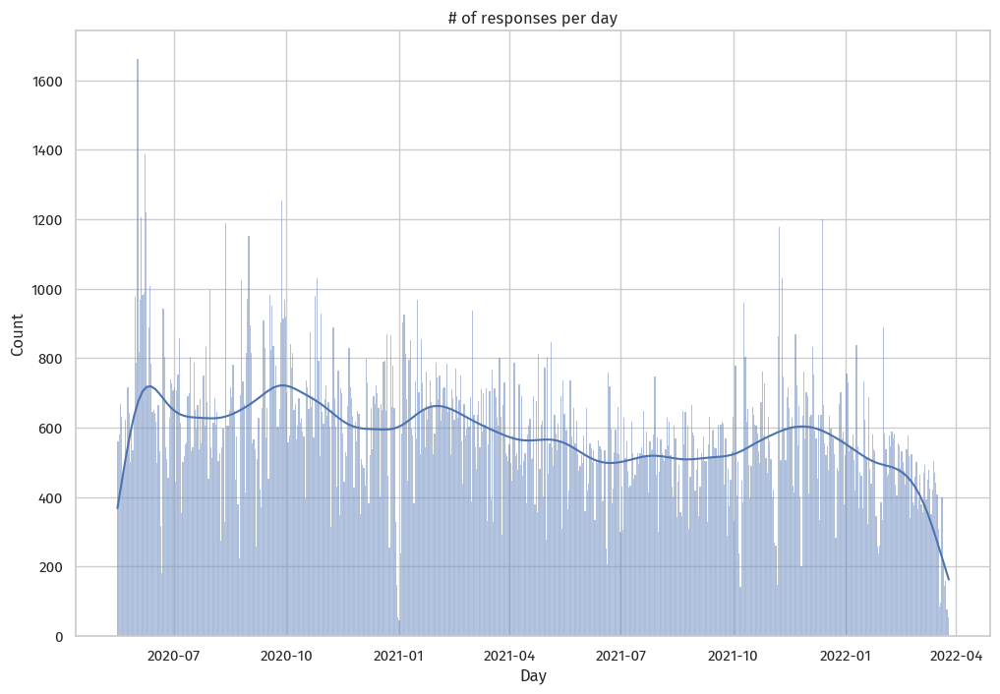

In [11]:
_, ax = plt.subplots(figsize=(12, 8))
sns.histplot(df['Day'], bins=totdays, kde=True, ax=ax).set(title='# of responses per day')
plt.show()

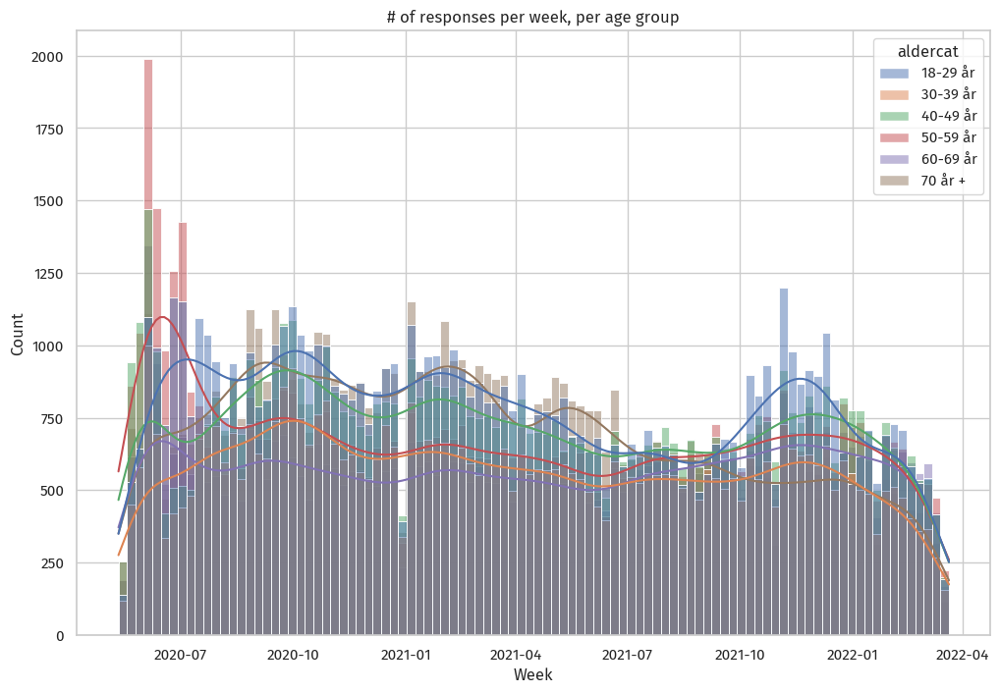

In [12]:
ALDER_ORDER = ['18-29 år', '30-39 år', '40-49 år', '50-59 år', '60-69 år', '70 år +']

_, ax = plt.subplots(figsize=(12, 8))
sns.histplot(data=df, x='Week', bins=df['Week'].nunique(), kde=True, hue='aldercat', hue_order=ALDER_ORDER, multiple='layer', ax=ax).set(title='# of responses per week, per age group')
plt.show()

### Limiting the time frame

Seeing there is a significant drop in participation starting in 2022, we choose to focus our study on the time frame:

**July 2020 to December 2021**

In [13]:
df = df[(df['Day'] >= '2020-07-01') & (df['Day'] < '2022-01-01')]

## Studying the number of contacts

In [14]:
df['Q4a_all'] = df['Q4a_1'] + df['Q4a_2'] + df['Q4a_3'] + df['Q4a_4']
df['Q4b_all'] = df['Q4b_1'] + df['Q4b_2'] + df['Q4b_3'] + df['Q4b_4']

df['Q4a_all'].describe()

count          325234.0
mean       60748.473699
std      8666728.864109
min              -400.0
25%                 1.0
50%                 5.0
75%                12.0
max        3099999996.0
Name: Q4a_all, dtype: Float64

In [15]:
df.groupby('aldercat')['Q4a_all'].median()

aldercat
18-29 år    6.0
30-39 år    5.0
40-49 år    5.0
50-59 år    5.0
60-69 år    4.0
70 år +     3.0
Name: Q4a_all, dtype: Float64

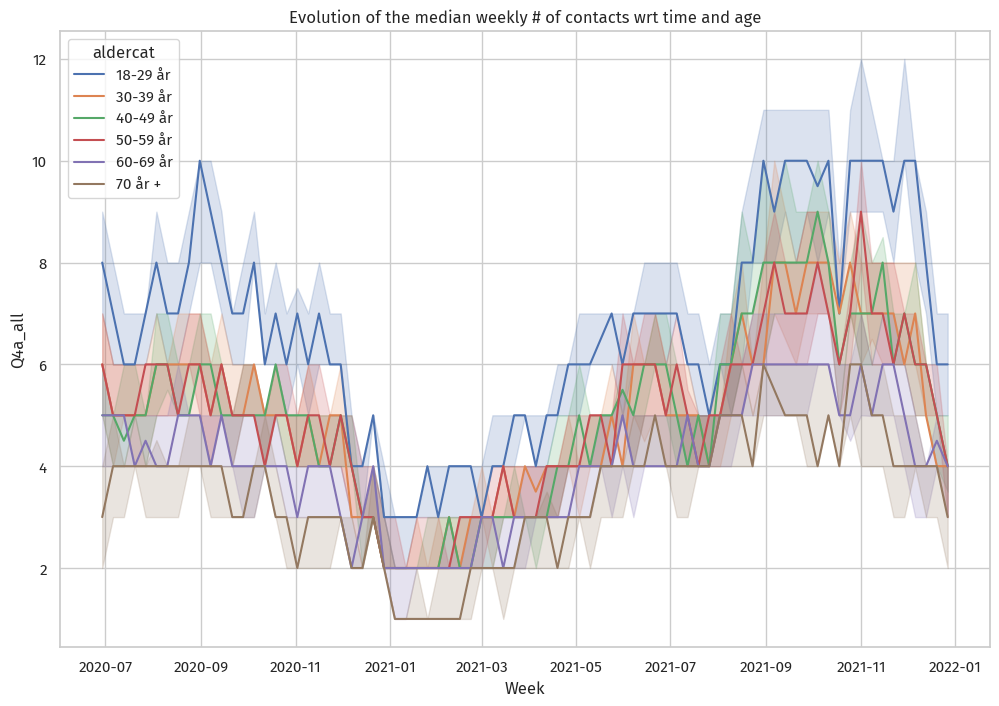

In [16]:
_, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(
    data=df, x='Week', y='Q4a_all', hue='aldercat', hue_order=ALDER_ORDER, estimator='median', errorbar=('ci', 95), ax=ax
).set(title='Evolution of the median weekly # of contacts wrt time and age')
plt.show()

In [17]:
df.groupby('aldercat')['Q4a_all'].agg(
    Quantile_05 = lambda x: np.quantile(x, 0.05),
    Quantile_25 = lambda x: np.quantile(x, 0.25),
    Quantile_50 = lambda x: np.quantile(x, 0.50),
    Quantile_75 = lambda x: np.quantile(x, 0.75),
    Quantile_95 = lambda x: np.quantile(x, 0.95),
    Average     = lambda x: np.mean(x),
    Maximum     = lambda x: np.max(x),
    N = lambda x: len(x),
    N_100_Plus = lambda x: np.sum(x >= 100),
    N_1_000_Plus = lambda x: np.sum(x >= 1000),
    N_10_000_Plus = lambda x: np.sum(x >= 10000),
    N_0_Less = lambda x: np.sum(x < 0)
)

,Quantile_05,Quantile_25,Quantile_50,Quantile_75,Quantile_95,Average,Maximum,N,N_100_Plus,N_1_000_Plus,N_10_000_Plus,N_0_Less
aldercat,,,,,,,,,,,,
18-29 år,0,2,6,15,62,96449.037602,1000000075,63933,1986,261,82,1
30-39 år,0,2,5,12,50,104689.640977,3099999996,47231,1098,171,50,0
40-49 år,0,1,5,12,50,93243.423702,1000000174,58173,1355,187,41,0
50-59 år,0,1,5,12,50,21629.548936,1000000001,51986,1097,110,23,1
60-69 år,0,1,4,10,37,46514.061146,1000000115,45089,700,63,16,2
70 år +,0,1,3,8,28,10.887423,80001,58822,526,39,3,3


In [18]:
df[df['Q4a_all'] < 0]

,udsendt,Timings_dateFirstEntry,Timings_dateLastEntry,Timings_dateFinish,Timings_timeTotalMinutes,koen,aldernum,aldercat,postnr,kommune,kommune_aktuel,region,Q1_1,Q1_2,Q2_1,Q2_2,Q2_3,Q2_4,Q2_5,Q2_6,Q3_1,Q3_2,Q3_3,Q3_4,Q3_5,Q3_6,Q3_7,Q4a_1,Q4a_2,Q4a_3,Q4a_4,Q4b_1,Q4b_2,Q4b_3,Q4b_4,Q5_1,Q5_2,Q5_3,Q5_4,Q5_5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,Q6_6,Q6_7,Q6_8,Q6_9,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5,Ny1,Q2020NovNy1,Q2020NovNy2,Q2020NovNy3,Q2020NovNy4,Q2021FebNy1,Q2021DecNy1,Q2021DecNy2,Q10,Q11,Q12,Q14,Q15,Q16,DagVej,UgeVej,weight,antal_påbegyndt,antal_vaccinerede,population,Day,Week,Month,Year,Q4a_all,Q4b_all
orgpid,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
386ZG486,2020-08-13,2020-08-14,2020-08-14,2020-08-14,16,Kvinde,72,70 år +,4520.0,316 Holbæk,316 Holbæk,Sjælland,<NA>,7,1,7,7,1,4,4,7,7,7,7,7,7,7,-20,0,2,1,<NA>,<NA>,2,2,<NA>,<NA>,<NA>,7,7,4,7,4,7,7,7,4,7,5,False,False,False,False,False,Har ikke brugt ansigtsmaske,<NA>,NaN,<NA>,NaN,NaN,NaN,NaN,"Grundskole (folkeskole, privatskole, efterskole)",1 person,Jeg har ingen hjemmeboende børn,Pensionist eller efterlønsmodtager,A: Socialdemokratiet,Vil ikke svare,1.044012,1.500285,1.954294,NaN,NaN,NaN,2020-08-14,2020-08-10,2020-08-01,2020-01-01,-17,<NA>
110AS721,2020-09-16,2020-09-30,2020-09-30,2020-09-30,7,Mand,59,50-59 år,3300.0,260 Halsnæs,260 Halsnæs,Hovedstaden,3,6,3,6,7,6,4,5,3,2,3,7,2,5,2,0,6,-7,0,<NA>,4,<NA>,<NA>,2,5,2,3,1,4,5,4,2,4,3,7,4,5,False,False,False,False,False,Har ikke brugt ansigtsmaske,<NA>,NaN,<NA>,NaN,NaN,NaN,NaN,"Erhvervsfaglig uddannelse (fx tømrer, frisør e...",2 personer,Jeg har ingen hjemmeboende børn,"Lønmodtager i det offentlige (stat, kommune el...",A: Socialdemokratiet,A: Socialdemokratiet,0.832716,1.084473,1.118690,NaN,NaN,NaN,2020-09-30,2020-09-28,2020-09-01,2020-01-01,-1,<NA>
643DA002,2020-11-10,2020-11-11,2020-11-11,2020-11-11,7,Mand,22,18-29 år,9220.0,851 Aalborg,851 Aalborg,Nordjylland,<NA>,2,1,4,4,2,7,7,7,3,7,7,7,1,3,-100,-100,-100,-100,<NA>,<NA>,<NA>,<NA>,6,3,2,7,6,7,1,6,1,1,1,7,1,1,False,False,False,False,False,Har ikke brugt ansigtsmaske,<NA>,Nej,False,NaN,NaN,NaN,NaN,Korte videregående (fx laborant eller datamati...,1 person,Jeg har ingen hjemmeboende børn,Lønmodtager i en privat virksomhed,Vil ikke svare,D: Nye Borgerlige,1.133394,0.344177,0.283422,NaN,NaN,NaN,2020-11-11,2020-11-09,2020-11-01,2020-01-01,-400,<NA>
691MH476,2021-03-13,2021-03-13,2021-03-13,2021-03-13,10,Mand,70,70 år +,4700.0,370 Næstved,370 Næstved,Sjælland,1,4,5,5,4,4,3,3,5,4,6,4,4,4,4,2,1,-9,5,-1,1,<NA>,1,1,1,2,3,1,4,4,4,4,4,2,4,4,4,False,False,False,False,False,7-9 gange,False,"Ja, jeg er blevet testet negativ",False,NaN,"Jeg er endnu ikke blevet tilbudt vaccination, ...",NaN,NaN,Mellemlang videregående (fx teknikum ingeniør ...,2 personer,Jeg har ingen hjemmeboende børn,Selvstændig,V: Venstre,D: Nye Borgerlige,1.188218,0.329135,0.541584,5.750030e+05,2.529180e+05,4865014.0,2021-03-13,2021-03-08,2021-03-01,2021-01-01,-1,<NA>
278PR786,2021-05-08,2021-05-08,2021-05-08,2021-05-08,8,Kvinde,64,60-69 år,4230.0,330 Slagelse,330 Slagelse,Sjælland,4,6,4,7,7,7,4,3,7,7,7,6,6,7,7,0,0,-2,0,<NA>,<NA>,<NA>,<NA>,6,6,<NA>,7,2,3,6,4,3,7,6,4,<NA>,5,False,False,False,False,False,4-6 gange,<NA>,Nej,False,NaN,Jeg er færdigvaccineret og har modtaget alle n...,NaN,NaN,Mellemlang videregående (fx teknikum ingeniør ...,1 person,Jeg har ingen hjemmeboende børn,Pensionist eller efterlønsmodtager,V: Venstre,I tvivl om partivalg,1.079764,0.668315,0.894690,1.496329e+06,8.587861e+05,4865014.0,2021-05-08,2021-05-03,2021-05-01,2021-01-01,-2,<NA>
214AS834,2021-05-23,2021-05-23,2021-05-23,2021-05-23,17,Mand,66,60-69 år,2860.0,159 Gladsaxe,159 Gladsaxe,Hovedstaden,2,2,3,7,4,7,4,4,7,6,4,6,7,2,3,0,-6,-2,-50,<NA>,<NA>,<NA>,<NA>,6,6,3,6,1,4,5,5,4,4,5,5,6,3,False,False,False,False,False,10 gange eller mere,<NA>,"Ja, jeg er blevet testet negativ",False,NaN,Jeg er færdigvaccineret og har modtaget alle n...,NaN,NaN,Mellemlang videregående (fx teknikum ingeniør ...,1 person,Jeg har ingen hjemmeboende børn,"Lø

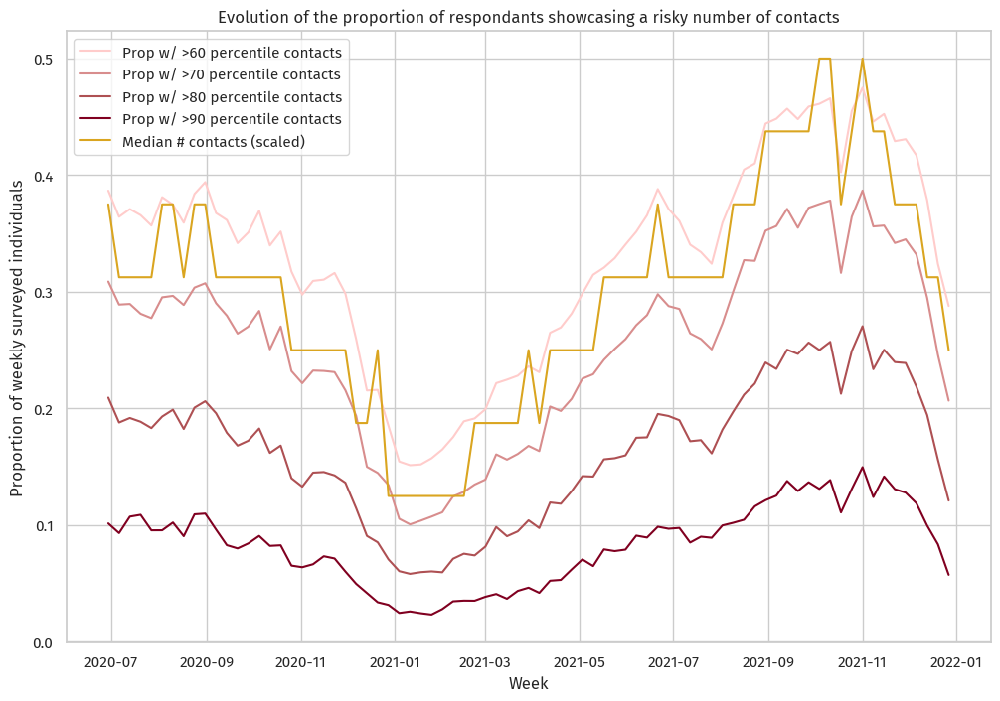

In [19]:
df_obs = df[(df['Day'] >= '2020-07-01') & (df['Day'] < '2020-10-01')]

df['at_risk_60'] = df['Q4a_all'] > np.quantile(df_obs['Q4a_all'], 0.60)
df['at_risk_70'] = df['Q4a_all'] > np.quantile(df_obs['Q4a_all'], 0.70)
df['at_risk_80'] = df['Q4a_all'] > np.quantile(df_obs['Q4a_all'], 0.80)
df['at_risk_90'] = df['Q4a_all'] > np.quantile(df_obs['Q4a_all'], 0.90)

del df_obs

median_normaliser = df.groupby('Week')['Q4a_all'].median().max() * 2

_, ax = plt.subplots(figsize=(12, 8))

sns.lineplot(
    data=df, x='Week', y='at_risk_60', estimator='mean', errorbar=None, label='Prop w/ >60 percentile contacts', color='#ffcccb', ax=ax
).set(ylabel='Proportion of weekly surveyed individuals', title='Evolution of the proportion of respondants showcasing a risky number of contacts')

sns.lineplot(
    data=df, x='Week', y='at_risk_70', estimator='mean', errorbar=None, label='Prop w/ >70 percentile contacts', color='#d88d8d', ax=ax
)

sns.lineplot(
    data=df, x='Week', y='at_risk_80', estimator='mean', errorbar=None, label='Prop w/ >80 percentile contacts', color='#ae5053', ax=ax
)

sns.lineplot(
    data=df, x='Week', y='at_risk_90', estimator='mean', errorbar=None, label='Prop w/ >90 percentile contacts', color='#800020', ax=ax
)

sns.lineplot(
    data=df, x='Week', y='Q4a_all', estimator=lambda x: np.median(x) / median_normaliser, errorbar=None, label='Median # contacts (scaled)', color='goldenrod', ax=ax
)

plt.show()

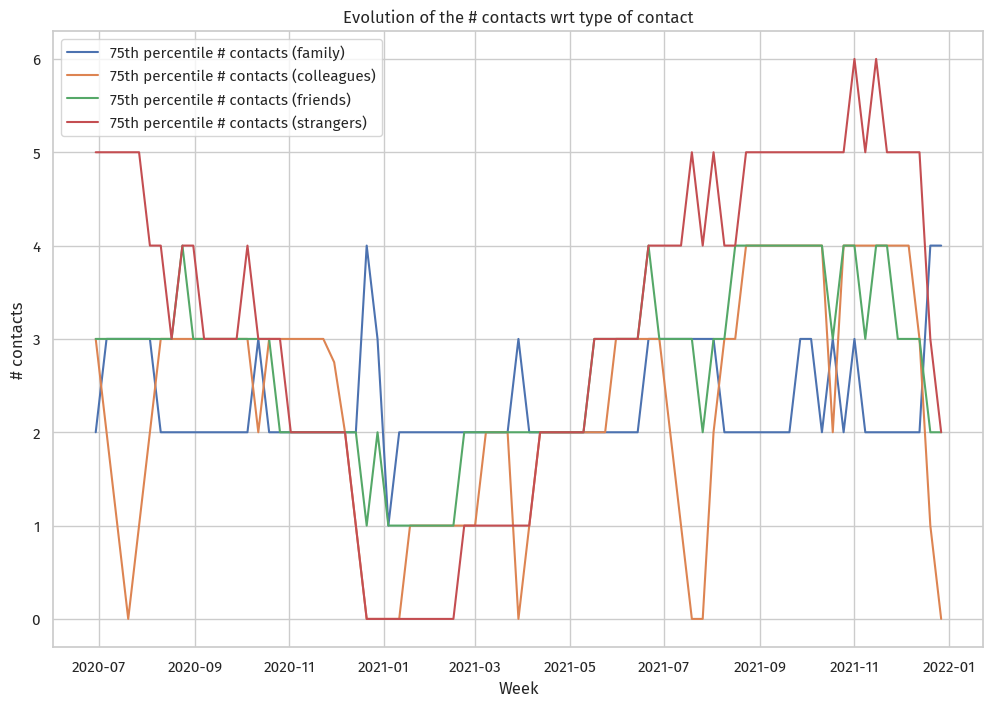

In [20]:
_, ax = plt.subplots(figsize=(12, 8))

sns.lineplot(
    data=df, x='Week', y='Q4a_1', estimator=lambda x: np.quantile(x, 0.75), errorbar=None, label='75th percentile # contacts (family)', ax=ax
).set(ylabel='# contacts', title='Evolution of the # contacts wrt type of contact')

sns.lineplot(
    data=df, x='Week', y='Q4a_2', estimator=lambda x: np.quantile(x, 0.75), errorbar=None, label='75th percentile # contacts (colleagues)', ax=ax
)

sns.lineplot(
    data=df, x='Week', y='Q4a_3', estimator=lambda x: np.quantile(x, 0.75), errorbar=None, label='75th percentile # contacts (friends)', ax=ax
)

sns.lineplot(
    data=df, x='Week', y='Q4a_4', estimator=lambda x: np.quantile(x, 0.75), errorbar=None, label='75th percentile # contacts (strangers)', ax=ax
)

plt.show()

## Studying individual behaviours

Q3) To what extent were you yesterday aware to...
* Q3_1) Ensure good hand hygiene by washing your hands frequently or using hand sprays.
* Q3_2) Avoid physical contact.
* Q3_3) Ensure frequent and thorough cleaning.
* Q3_4) Keep away from elderly and chronically ill people.
* Q3_5) Keep 1-2 meters distance to other people.
* Q3_6) Minimize your going to places, where many people typically are going.
* Q3_7) Minimize activities where you have contact to other people.

Scaled from 1-7, 8=`I don't know`

To measure individual behaviour, we use, for every response, the average of all subpoints that are not 8.

134 invalid responses


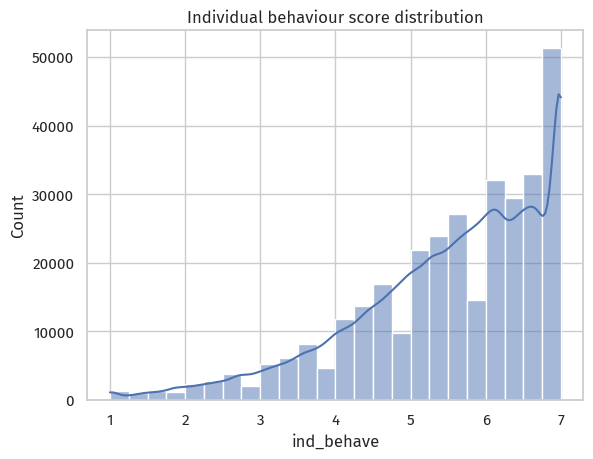

In [21]:
df['ind_behave'] = df[[f'Q3_{i}' for i in range(1, 8)]].astype('double').mean(axis=1)
print('{:d} invalid responses'.format(df['ind_behave'].isna().sum()))
sns.histplot(data=df, x='ind_behave', bins=np.arange(1., 7.01, 0.25), kde=True).set(title='Individual behaviour score distribution')
plt.show()

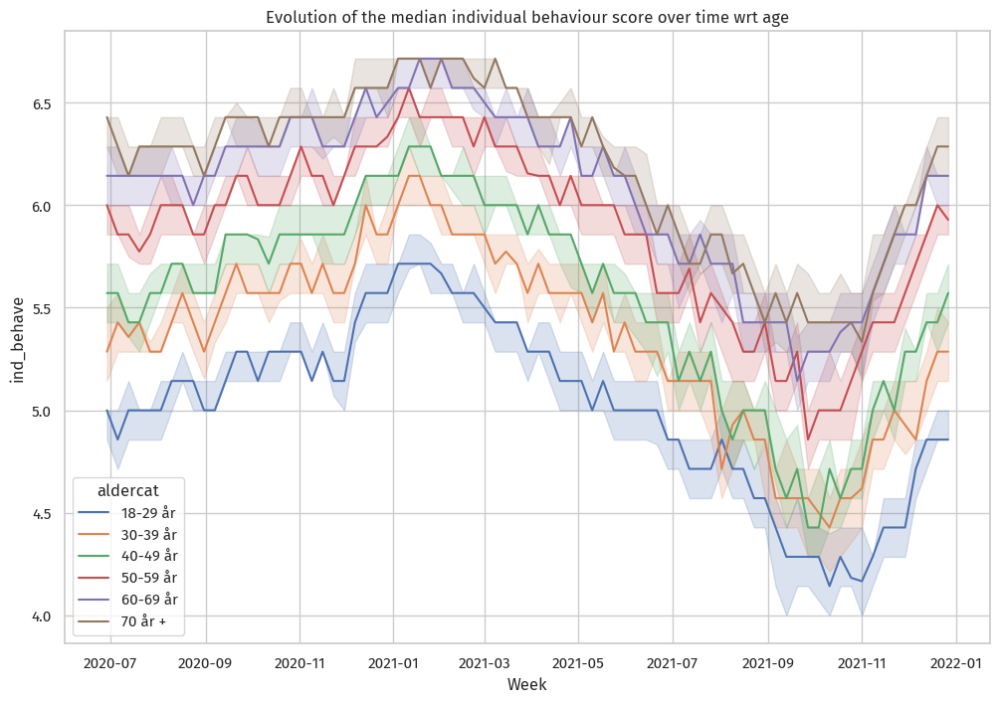

In [22]:
_, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(
    data=df, x='Week', y='ind_behave', estimator='median', hue='aldercat', hue_order=ALDER_ORDER, ax=ax
).set(title='Evolution of the median individual behaviour score over time wrt age')
plt.show()

### Distancing

* Q3_5) Keep 1-2 meters distance to other people.
* Q5_4) You yourself took others into account in terms of keeping distance
* Q5_3) People did not care for each other in terms of spreading infection
* Q5_1) Others took you into account in relation to keeping distance

Scaled from 1-7, 8=`I don't know`

They can be summed up as:
* Q3_5) You
* Q5_4) You => Others
* Q5_3) Others => Others
* Q5_1) Others => You

Q5_3 is formulated in a negative way: we have to invert the order of the values.

In [23]:
df['Q5_3_inv'] = df['Q5_3'].max() + 1 - df['Q5_3']

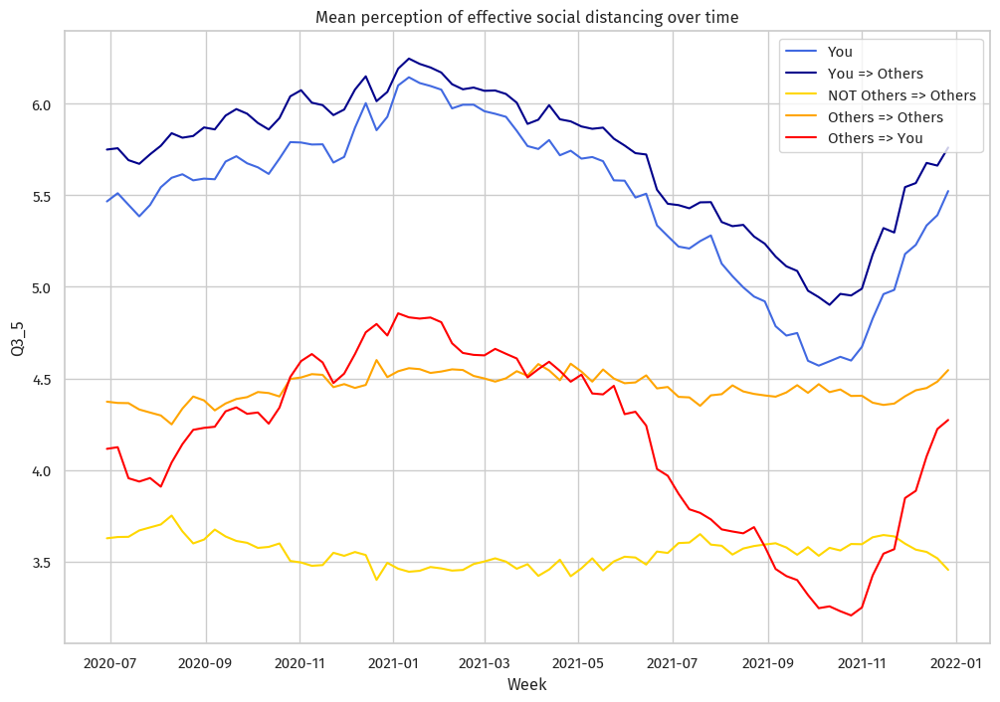

In [24]:
_, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(
    data=df, x='Week', y='Q3_5', estimator='mean', ax=ax, label='You', color='royalblue', errorbar=None
).set(title='Mean perception of effective social distancing over time')
sns.lineplot(
    data=df, x='Week', y='Q5_4', estimator='mean', ax=ax, label='You => Others', color='darkblue', errorbar=None
)
sns.lineplot(
    data=df, x='Week', y='Q5_3', estimator='mean', ax=ax, label='NOT Others => Others', color='gold', errorbar=None
)
sns.lineplot(
    data=df, x='Week', y='Q5_3_inv', estimator='mean', ax=ax, label='Others => Others', color='orange', errorbar=None
)
sns.lineplot(
    data=df, x='Week', y='Q5_1', estimator='mean', ax=ax, label='Others => You', color='red', errorbar=None
)
plt.legend()
plt.show()

## Behaviour of others

We build a new feature to encompass the feeling of people towards others respecting, or not, health advices from the authorities.

* Q5_1) Others took you into account in relation to keeping distance
* Q5_2) Others supported the advice of the authorities to avoid spreading infection
* Q5_3) People did not care for each other in terms of spreading infection
* Q6_3) I trust that the others I meet can avoid spreading infection

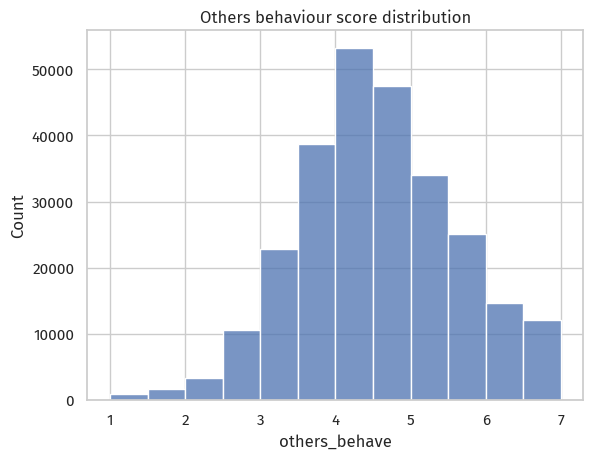

In [25]:
df['others_behave'] = (df['Q5_1'] + df['Q5_2'] + df['Q5_3_inv'] + df['Q6_3']).astype('double')/4
sns.histplot(data=df, x='others_behave', bins=np.arange(1., 7.5, 0.5), kde=False).set(title='Others behaviour score distribution')
plt.show()

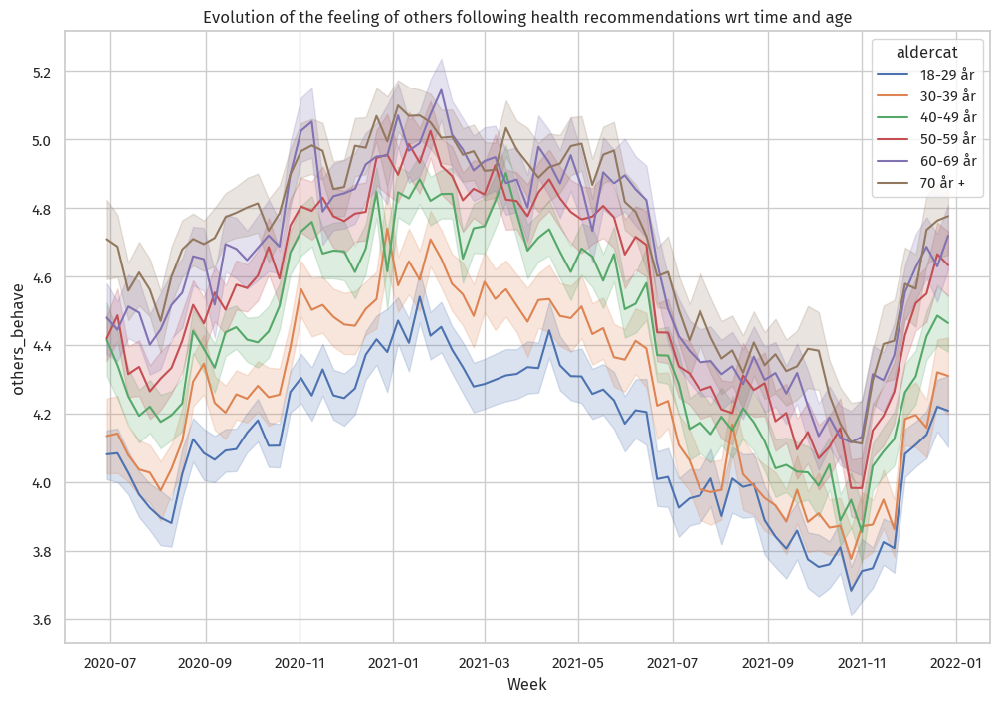

In [26]:
_, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(
    data=df, x='Week', y='others_behave', estimator='mean', hue='aldercat', hue_order=ALDER_ORDER, ax=ax
).set(title='Evolution of the feeling of others following health recommendations wrt time and age')
plt.show()

### Random strangers

We try to make a distinction between second-party and third-party strangers. To do so, we isolate questions Q5_2 and Q5_3 that are about others in general, not others one has contacts with.

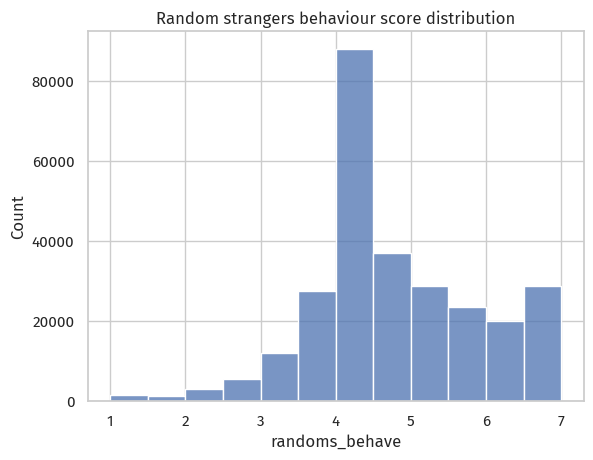

In [27]:
df['randoms_behave'] = (df['Q5_2'] + df['Q5_3_inv']).astype('double')/2
sns.histplot(data=df, x='randoms_behave', bins=np.arange(1., 7.5, 0.5), kde=False).set(title='Random strangers behaviour score distribution')
plt.show()

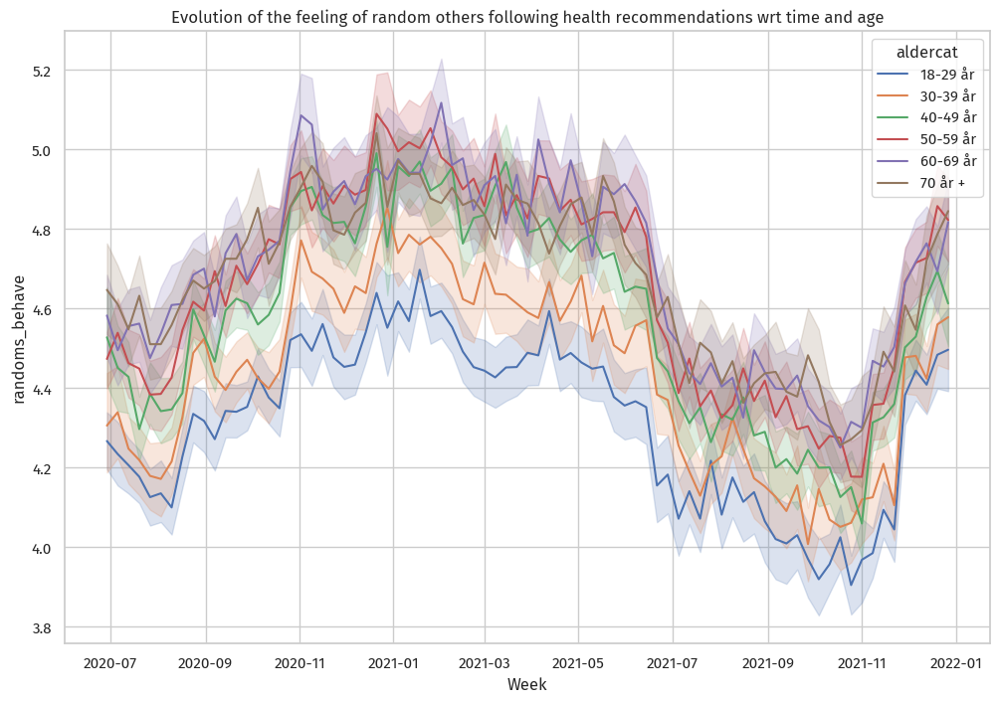

In [28]:
_, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(
    data=df, x='Week', y='randoms_behave', estimator='mean', hue='aldercat', hue_order=ALDER_ORDER, ax=ax
).set(title='Evolution of the feeling of random others following health recommendations wrt time and age')
plt.show()

## Trust in authorities' advice

* Q2_3) If I follow the advice of the health authorities, I will be as safe as possible during the corona epidemic.
* Q2_4) If I follow the advice of the health authorities, I will help protect others from the corona virus.
* Q6_2) The health authorities' advice are important in order to achieve a safe society.
* Q6_8) The advice of the health authorities are sufficient to prevent the spread of infection.
* Q6_9) I trust the political strategy behind the health authorities' advice.

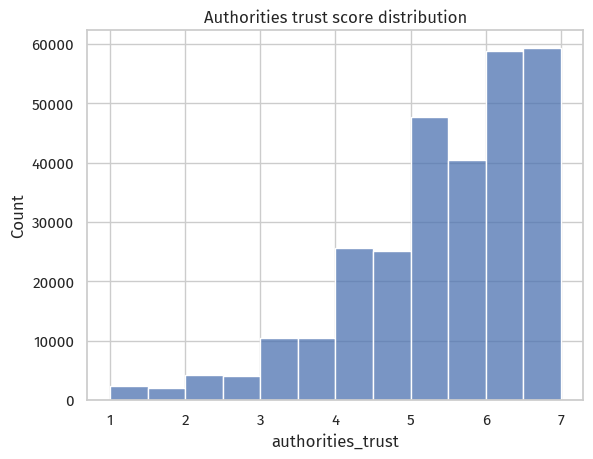

In [29]:
df['authorities_trust'] = (df['Q2_3'] + df['Q2_4'] + df['Q6_2'] + df['Q6_8'] + df['Q6_9']).astype('double')/5
sns.histplot(data=df, x='authorities_trust', bins=np.arange(1., 7.5, 0.5), kde=False).set(title='Authorities trust score distribution')
plt.show()

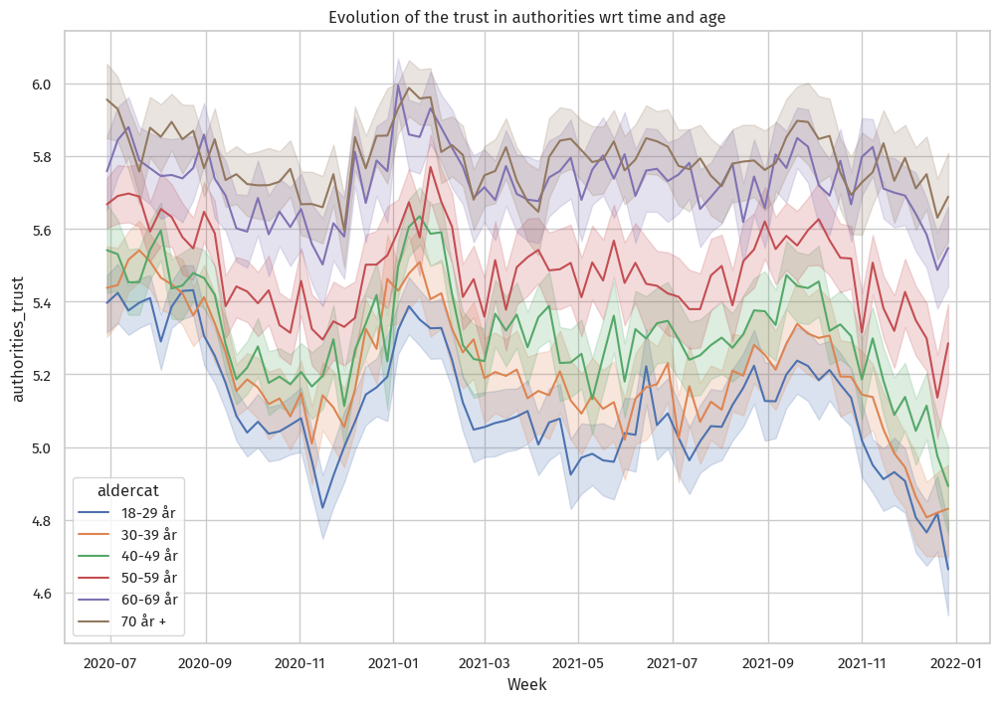

In [30]:
_, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(
    data=df, x='Week', y='authorities_trust', estimator='mean', hue='aldercat', hue_order=ALDER_ORDER, ax=ax
).set(title='Evolution of the trust in authorities wrt time and age')
plt.show()

## Quality of life degradation

* Q2_5) If I follow the advice of the health authorities, my relationship with people outside the family will be impaired.
* Q2_6) If I follow the advice of the health authorities, my life will be degraded.
* Q6_7) The health authorities' advice limits my daily activities to a high degree

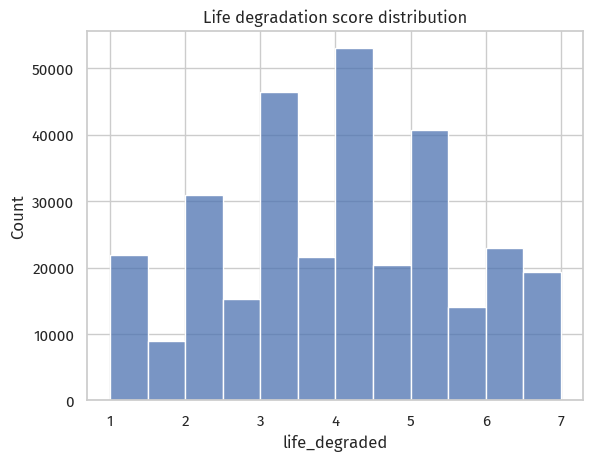

In [31]:
df['life_degraded'] = (df['Q2_5'] + df['Q2_6'] + df['Q6_7']).astype('double')/3
sns.histplot(data=df, x='life_degraded', bins=np.arange(1., 7.5, 0.5), kde=False).set(title='Life degradation score distribution')
plt.show()

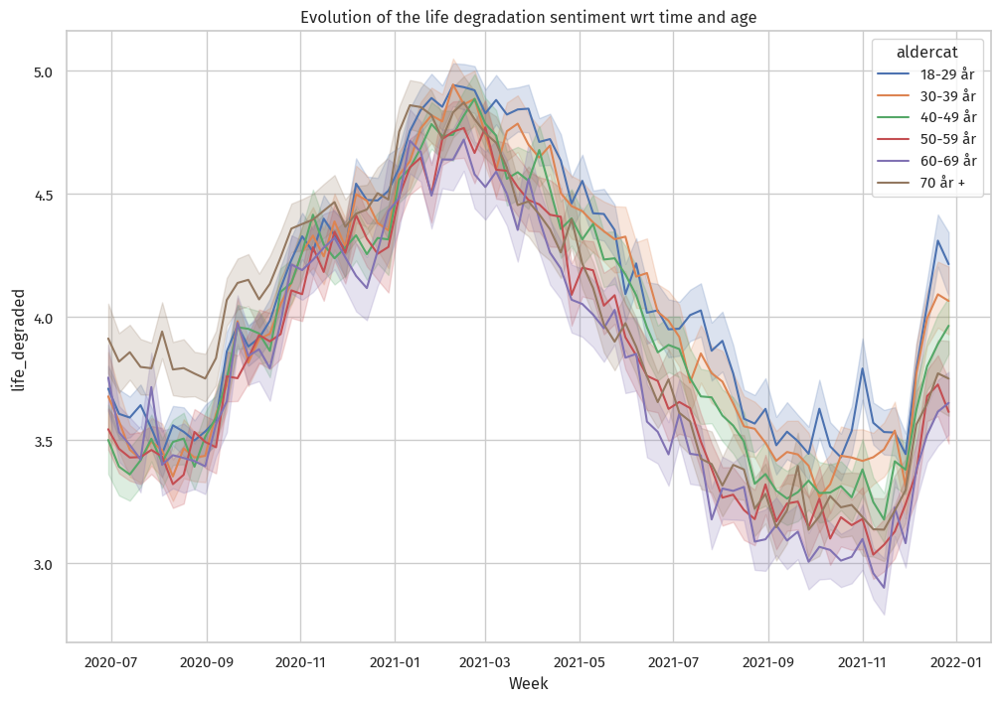

In [32]:
_, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(
    data=df, x='Week', y='life_degraded', estimator='mean', hue='aldercat', hue_order=ALDER_ORDER, ax=ax
).set(title='Evolution of the life degradation sentiment wrt time and age')
plt.show()

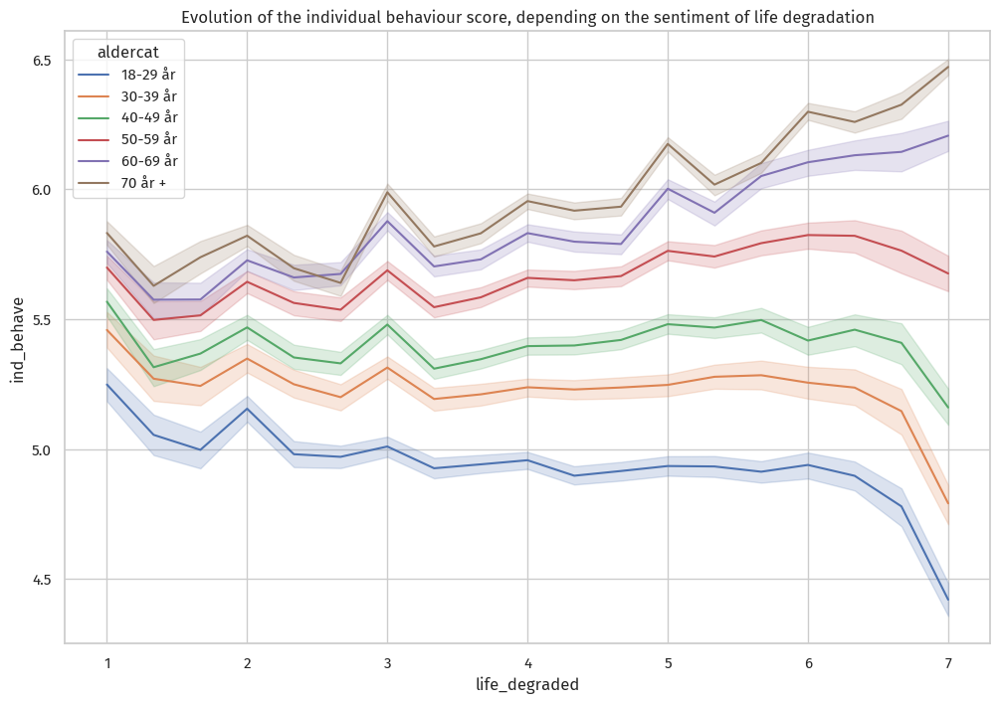

In [33]:
_, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(
    data=df, x='life_degraded', y='ind_behave', estimator='mean', hue='aldercat', hue_order=ALDER_ORDER, errorbar=('ci', 95), ax=ax
).set(title='Evolution of the individual behaviour score, depending on the sentiment of life degradation')
plt.show()

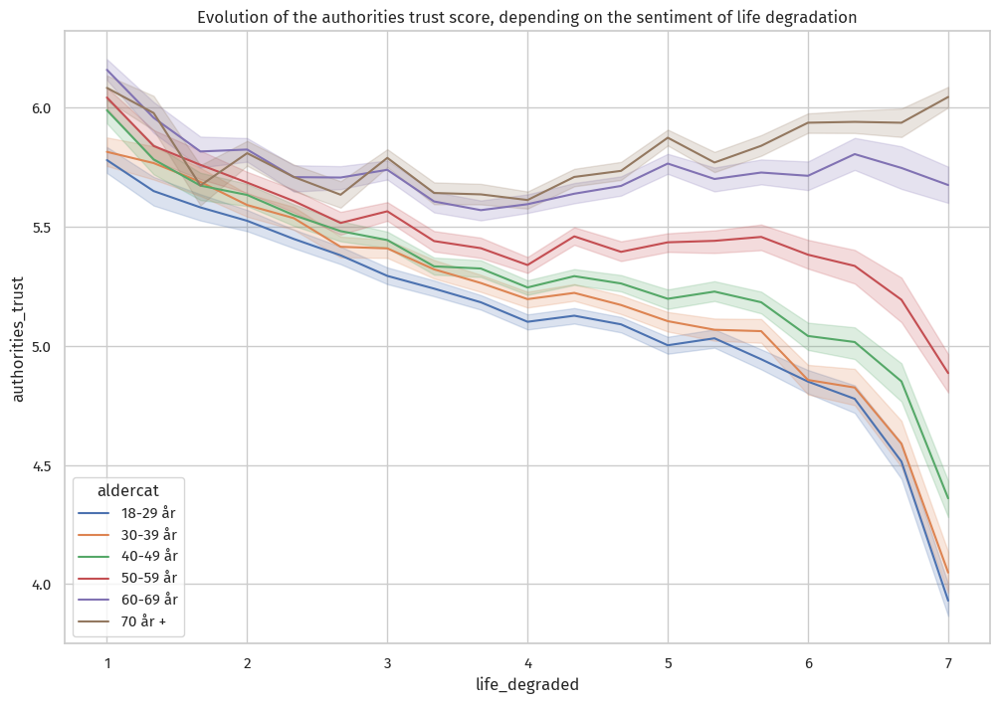

In [34]:
_, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(
    data=df, x='life_degraded', y='authorities_trust', estimator='mean', hue='aldercat', hue_order=ALDER_ORDER, errorbar=('ci', 95), ax=ax
).set(title='Evolution of the authorities trust score, depending on the sentiment of life degradation')
plt.show()

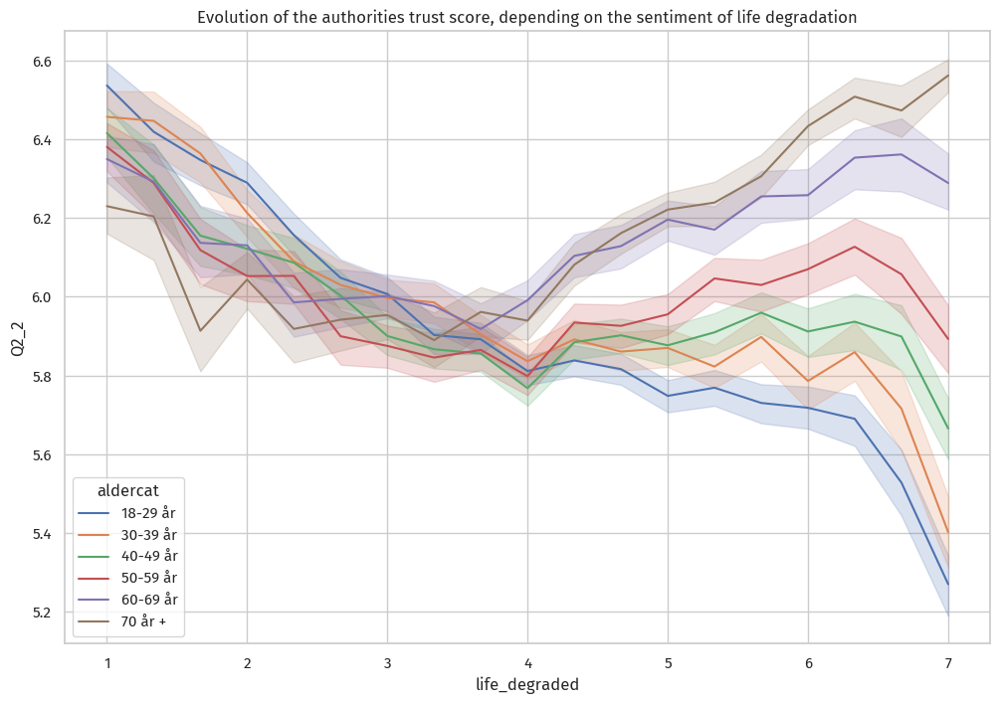

In [35]:
_, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(
    data=df, x='life_degraded', y='Q2_2', estimator='mean', hue='aldercat', hue_order=ALDER_ORDER, errorbar=('ci', 95), ax=ax
).set(title='Evolution of the authorities trust score, depending on the sentiment of life degradation')
plt.show()

## Analysis by sex

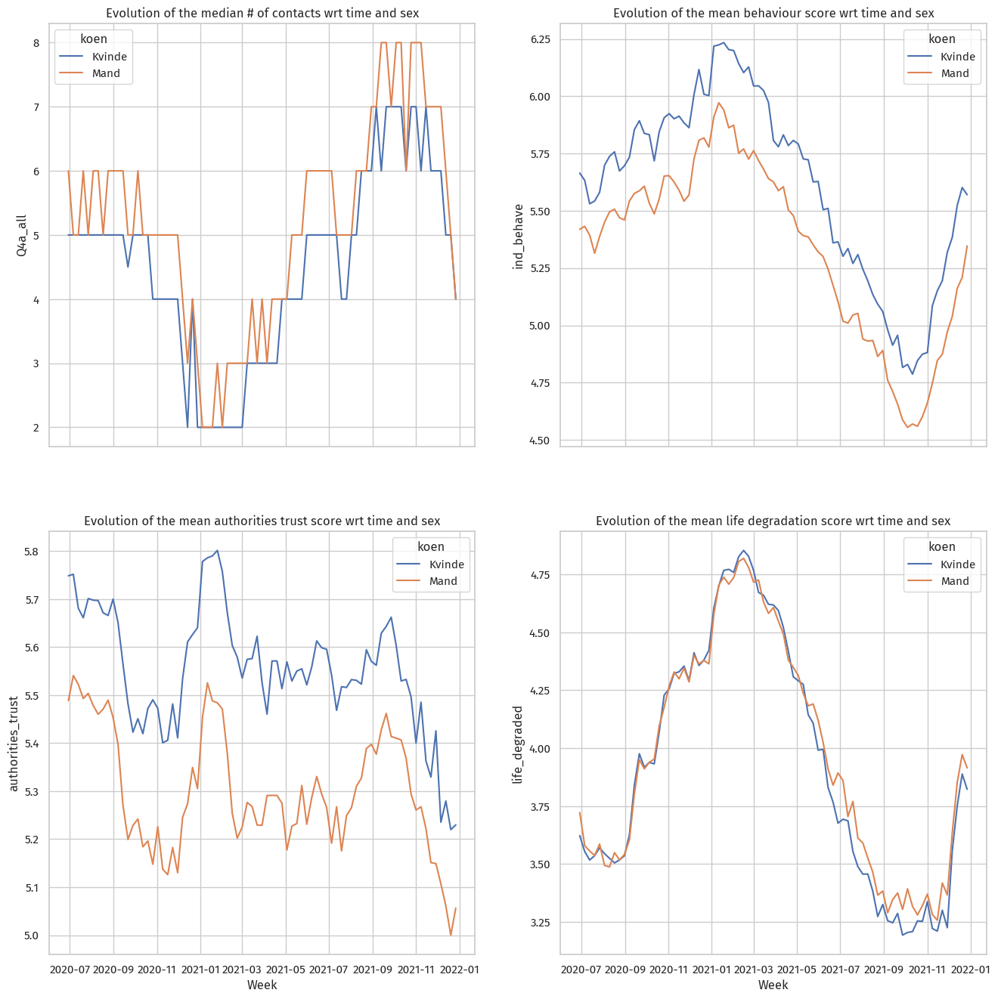

In [36]:
_, axs = plt.subplots(2, 2, figsize=(16, 16), sharex=True)

sns.lineplot(
    data=df, x='Week', y='Q4a_all', hue='koen', estimator='median', errorbar=None, ax=axs[0][0]
).set(title='Evolution of the median # of contacts wrt time and sex')

sns.lineplot(
    data=df, x='Week', y='ind_behave', hue='koen', estimator='mean', errorbar=None, ax=axs[0][1]
).set(title='Evolution of the mean behaviour score wrt time and sex')

sns.lineplot(
    data=df, x='Week', y='authorities_trust', hue='koen', estimator='mean', errorbar=None, ax=axs[1][0]
).set(title='Evolution of the mean authorities trust score wrt time and sex')

sns.lineplot(
    data=df, x='Week', y='life_degraded', hue='koen', estimator='mean', errorbar=None, ax=axs[1][1]
).set(title='Evolution of the mean life degradation score wrt time and sex')

plt.show()

## Churn analysis

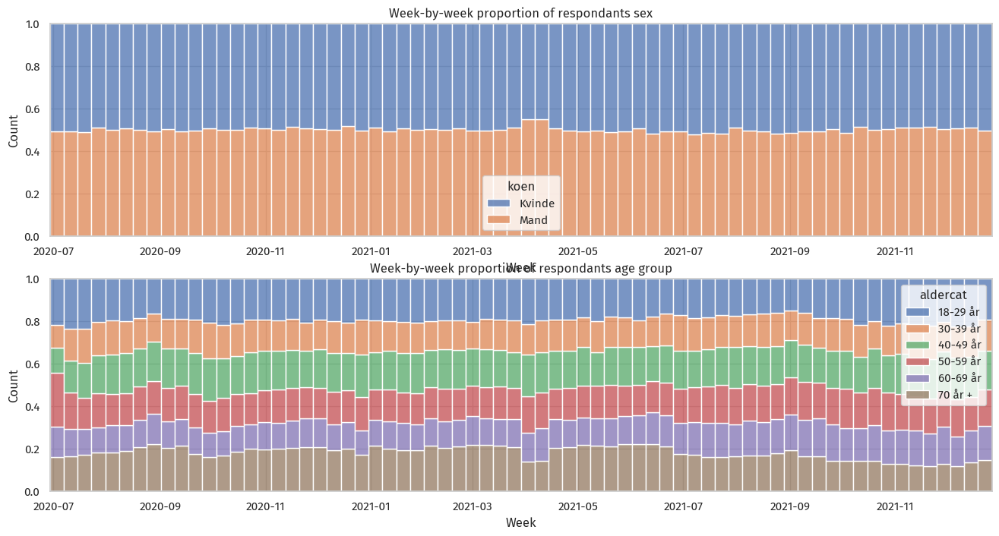

In [37]:
_, axs = plt.subplots(2, figsize=(16, 8))

sns.histplot(data=df, x='Week', hue='koen', multiple='fill', ax=axs[0]).set(title='Week-by-week proportion of respondants sex')
sns.histplot(data=df, x='Week', hue='aldercat', multiple='fill', ax=axs[1]).set(title='Week-by-week proportion of respondants age group')

plt.show()

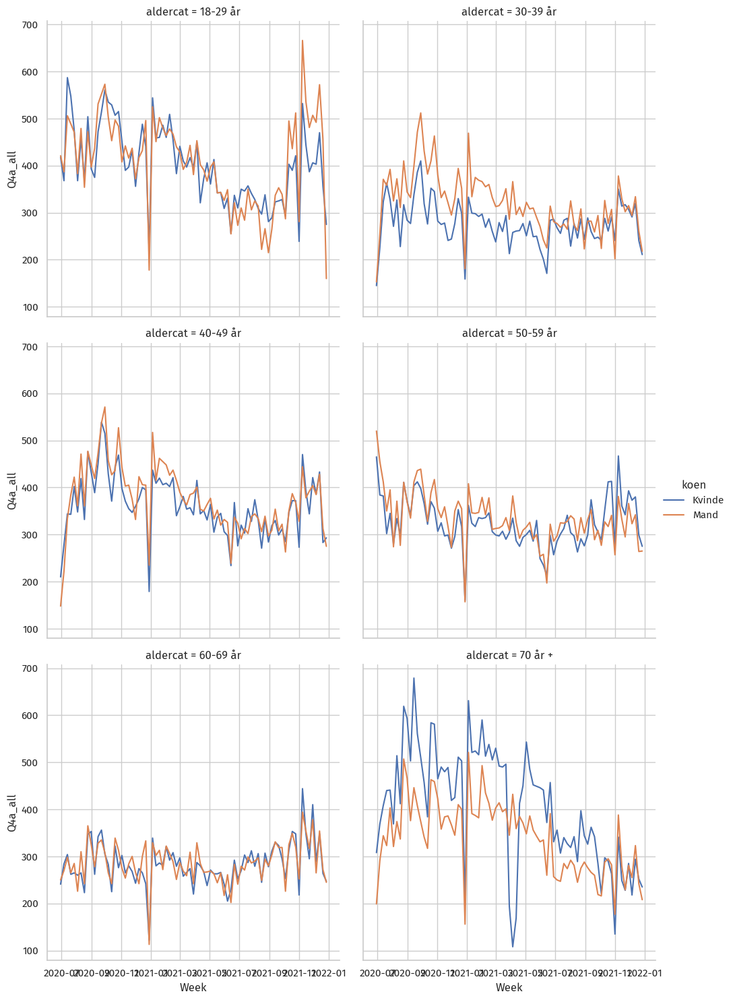

In [38]:
sns.relplot(data=df, x='Week', y='Q4a_all', hue='koen', col='aldercat', col_wrap=2, kind='line', estimator=len, errorbar=None)

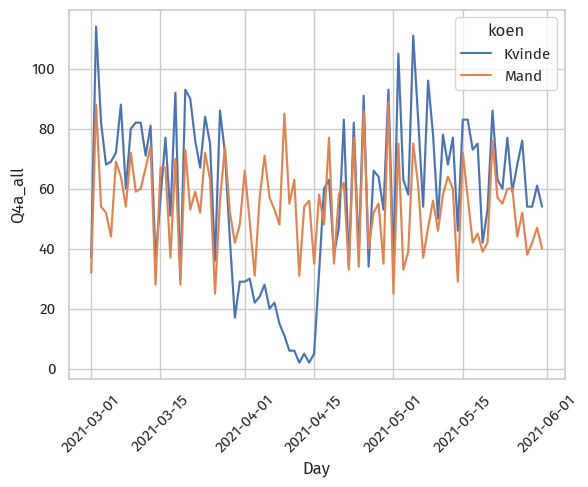

In [39]:
sns.lineplot(data=df[
    (df['Day'] >= '2021-03-01') &
    (df['Day'] <  '2021-06-01') &
    (df['aldernum'] >= 70)
], x='Day', y='Q4a_all', hue='koen', estimator=len).tick_params(axis='x', rotation=45)
plt.show()

## Analysing political affiliation

Q15) Voting at last election
What party did you vote for at the last general election? (5. juni 2019)

For this question, looking at every party individually would be difficult as they are numerous and some will be too small to attract a significant number of samples.

We keep the 5 biggest and group the other ones, ending uop with the following categories:

* Socialdemokratiet
* Venstre
* Dansk Folkeparti
* Radikale Venstre
* Socialistik Folkeparti
* Andre partier
* Stemmte blank / ikke
* NA: Havde ikke stemmeret, Vil ikke svare

The groundtruth of election results are as follows:

Turnout: 84.60%

* Blank / Invalid = 15.40% + 0.846 * (0.28%+0.78%) ~= 16.30%
* Socialdemokratiet = 0.846 * 25.90% ~= 21.91%
* Venstre = 0.846 * 23.39% ~= 19.79%
* Dansk Folkeparti = 0.846 * 8.74% ~= 7.39%
* Radikale Venstre = 0.846 * 8.63% ~= 7.30%
* Socialistik Folkeparti = 0.846 * 7.71% ~= 6.52%
* Andre partier = 100% - SUM(Others) ~= 20.79%

,0,Actual
Parti2019,,
Socialdemokratiet,0.296162,0.2191
Andre partier,0.227309,0.2079
Venstre,0.207080,0.1979
Stemte blankt/ikke,0.056352,0.1630
Dansk Folkeparti,0.051868,0.0739
Radikale Venstre,0.090966,0.0730
Socialistisk Folkeparti,0.070263,0.0652


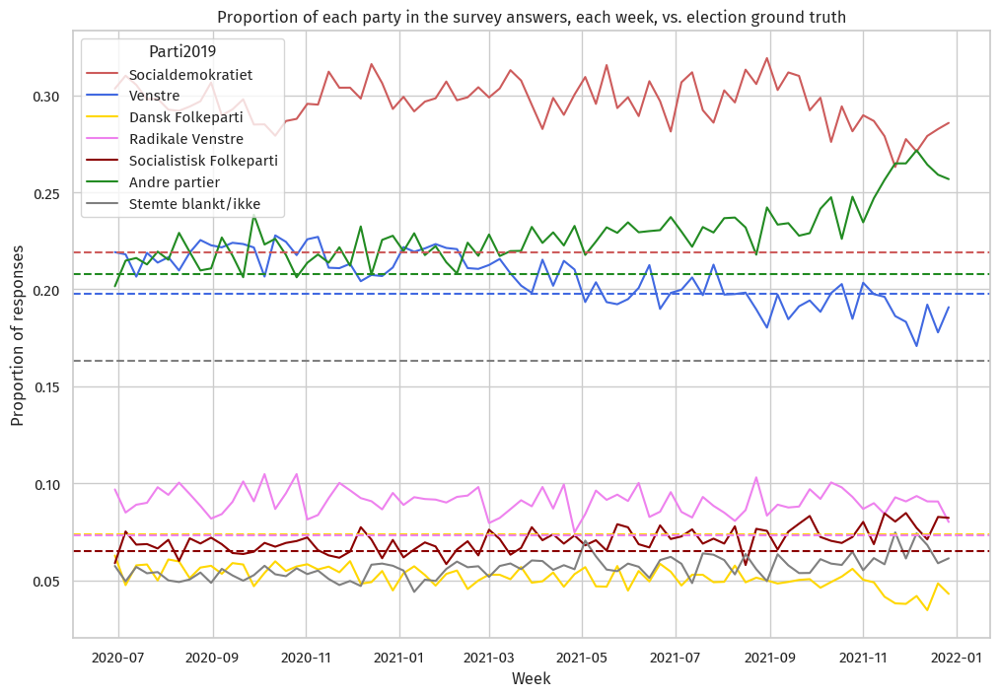

In [40]:
df['Parti2019'] = df['Q15'].map({
    'A: Socialdemokratiet': 'Socialdemokratiet',
    'V: Venstre': 'Venstre',
    'O: Dansk Folkeparti': 'Dansk Folkeparti',
    'B: Radikale': 'Radikale Venstre',
    'F: Socialistisk Folkeparti': 'Socialistisk Folkeparti',
    'C: Konservative': 'Andre partier',
    'D: Nye Borgerlige': 'Andre partier',
    'E: Klaus Riskjær Pedersen': 'Andre partier',
    'I: Liberal Alliance': 'Andre partier',
    'K: Kristendemokraterne': 'Andre partier',
    'P: Stram Kurs': 'Andre partier',
    'Ø: Enhedslisten': 'Andre partier',
    'Å: Alternativet': 'Andre partier',
    'Andre partier/kandidat uden for partierne': 'Andre partier',
    'Stemte blankt': 'Stemte blankt/ikke',
    'Stemte ikke': 'Stemte blankt/ikke'
}).astype('category')

PARTI_COLOURS = {
    'Socialdemokratiet': 'indianred',
    'Venstre': 'royalblue',
    'Dansk Folkeparti': 'gold',
    'Radikale Venstre': 'violet',
    'Socialistisk Folkeparti': 'darkred',
    'Andre partier': 'forestgreen',
    'Stemte blankt/ikke': 'grey'
}

GROUNDTRUTH_2019 = {
    'Socialdemokratiet': 0.2191,
    'Venstre': 0.1979,
    'Dansk Folkeparti': 0.0739,
    'Radikale Venstre': 0.0730,
    'Socialistisk Folkeparti': 0.0652,
    'Andre partier': 0.2079,
    'Stemte blankt/ikke': 0.1630
}

res = (df.groupby('Parti2019').size() / df.groupby('Parti2019').size().sum()).to_frame()
res['Actual'] = GROUNDTRUTH_2019
display(res.sort_values(by='Actual', ascending=False))

_, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(
    data=(df.groupby(['Week', 'Parti2019']).size() / df.groupby('Week')['Parti2019'].count()).reset_index(), 
    x='Week', y=0, hue='Parti2019',hue_order=PARTI_COLOURS.keys(), palette=PARTI_COLOURS, ax=ax
).set(title='Proportion of each party in the survey answers, each week, vs. election ground truth',
      ylabel='Proportion of responses')

for parti, groundtruth in GROUNDTRUTH_2019.items():
    plt.axhline(y=groundtruth, color=PARTI_COLOURS[parti], linestyle='--')

plt.show()

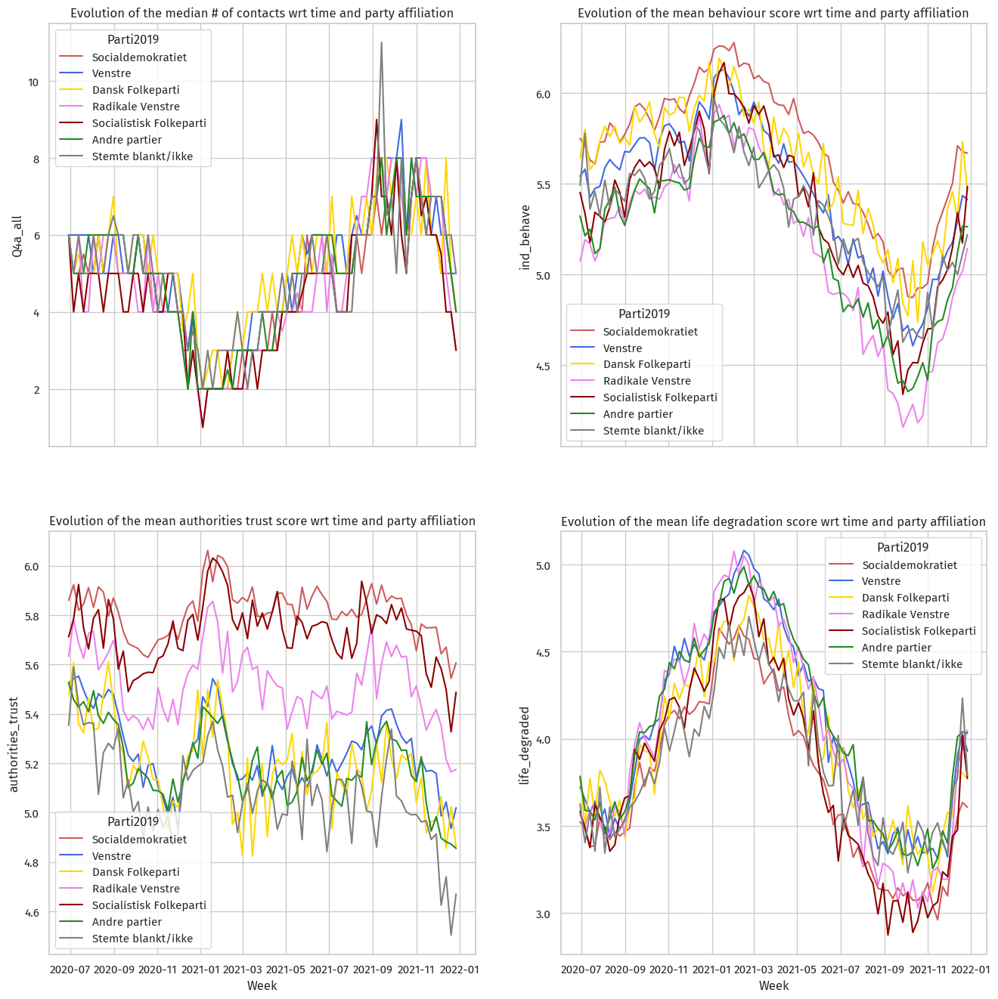

In [41]:
_, axs = plt.subplots(2, 2, figsize=(16, 16), sharex=True)

sns.lineplot(
    data=df, x='Week', y='Q4a_all', hue='Parti2019', hue_order=PARTI_COLOURS.keys(), palette=PARTI_COLOURS, estimator='median', errorbar=None, ax=axs[0][0]
).set(title='Evolution of the median # of contacts wrt time and party affiliation')

sns.lineplot(
    data=df, x='Week', y='ind_behave', hue='Parti2019', hue_order=PARTI_COLOURS.keys(), palette=PARTI_COLOURS, estimator='mean', errorbar=None, ax=axs[0][1]
).set(title='Evolution of the mean behaviour score wrt time and party affiliation')

sns.lineplot(
    data=df, x='Week', y='authorities_trust', hue='Parti2019', hue_order=PARTI_COLOURS.keys(), palette=PARTI_COLOURS, estimator='mean', errorbar=None, ax=axs[1][0]
).set(title='Evolution of the mean authorities trust score wrt time and party affiliation')

sns.lineplot(
    data=df, x='Week', y='life_degraded', hue='Parti2019', hue_order=PARTI_COLOURS.keys(), palette=PARTI_COLOURS, estimator='mean', errorbar=None, ax=axs[1][1]
).set(title='Evolution of the mean life degradation score wrt time and party affiliation')

plt.show()

## Analysing Education

Q10) Education 
What is your highest completed education? 
Scale: 

1. Elementary school 
2. High school 
3. Vocational training 
4. Short higher education 
5. Medium higher education 
6. Bachelor 
7. Long higher education 
8. Ph.D 

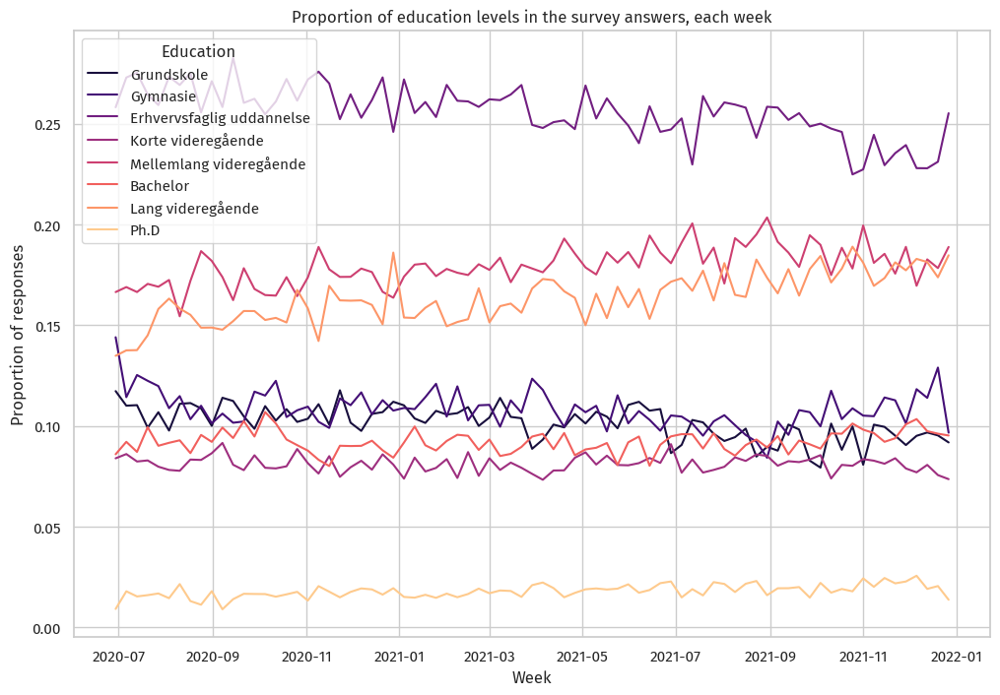

In [42]:
df['Education'] = df['Q10'].map({
    'Grundskole (folkeskole, privatskole, efterskole)': 'Grundskole',
    'Gymnasie (STX, HF, HHX , HTX og lign.)': 'Gymnasie',
    'Erhvervsfaglig uddannelse (fx tømrer, frisør eller kontorassistent)': 'Erhvervsfaglig uddannelse',
    'Korte videregående (fx laborant eller datamatiker)': 'Korte videregående',
    'Mellemlang videregående (fx teknikum ingeniør eller lærer)': 'Mellemlang videregående',
    'Bachelor (fx 1. del af en lang videregående uddannelse)': 'Bachelor',
    'Lang videregående (fx gymnasielærer, økonom eller jurist)': 'Lang videregående',
    'Ph.D og forskeruddanelser': 'Ph.D'
})

EDUCATION_ORDER = [
    'Grundskole',
    'Gymnasie',
    'Erhvervsfaglig uddannelse',
    'Korte videregående',
    'Mellemlang videregående',
    'Bachelor',
    'Lang videregående',
    'Ph.D'
]

EDUCATION_PALETTE = sns.color_palette('magma', n_colors=len(EDUCATION_ORDER))

_, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(
    data=(df.groupby(['Week', 'Education']).size() / df.groupby('Week')['Education'].count()).reset_index(), 
    x='Week', y=0, hue='Education',hue_order=EDUCATION_ORDER, palette=EDUCATION_PALETTE, ax=ax
).set(title='Proportion of education levels in the survey answers, each week',
      ylabel='Proportion of responses')

plt.show()

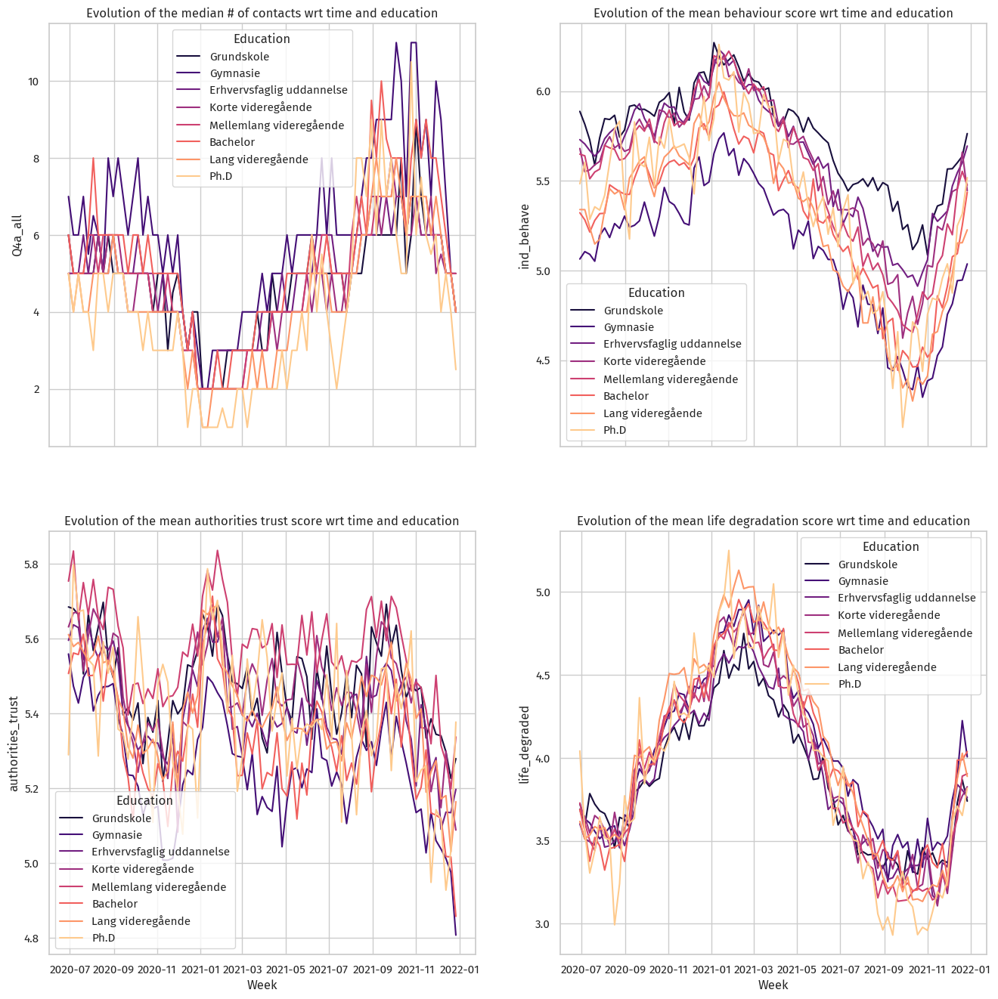

In [43]:
_, axs = plt.subplots(2, 2, figsize=(16, 16), sharex=True)

sns.lineplot(
    data=df, x='Week', y='Q4a_all', hue='Education',hue_order=EDUCATION_ORDER, palette=EDUCATION_PALETTE, estimator='median', errorbar=None, ax=axs[0][0]
).set(title='Evolution of the median # of contacts wrt time and education')

sns.lineplot(
    data=df, x='Week', y='ind_behave', hue='Education',hue_order=EDUCATION_ORDER, palette=EDUCATION_PALETTE, estimator='mean', errorbar=None, ax=axs[0][1]
).set(title='Evolution of the mean behaviour score wrt time and education')

sns.lineplot(
    data=df, x='Week', y='authorities_trust', hue='Education',hue_order=EDUCATION_ORDER, palette=EDUCATION_PALETTE, estimator='mean', errorbar=None, ax=axs[1][0]
).set(title='Evolution of the mean authorities trust score wrt time and education')

sns.lineplot(
    data=df, x='Week', y='life_degraded', hue='Education',hue_order=EDUCATION_ORDER, palette=EDUCATION_PALETTE, estimator='mean', errorbar=None, ax=axs[1][1]
).set(title='Evolution of the mean life degradation score wrt time and education')

plt.show()

## Analysing position

Q14) Position
What is your current occupation?
Scale:

1. Employee in a private company
2. Employee in the public sector (state, municipality or region)
3. Self employed
4. Student
5. Unemployed
6. Pensioner or early retirement recipient
7. Other

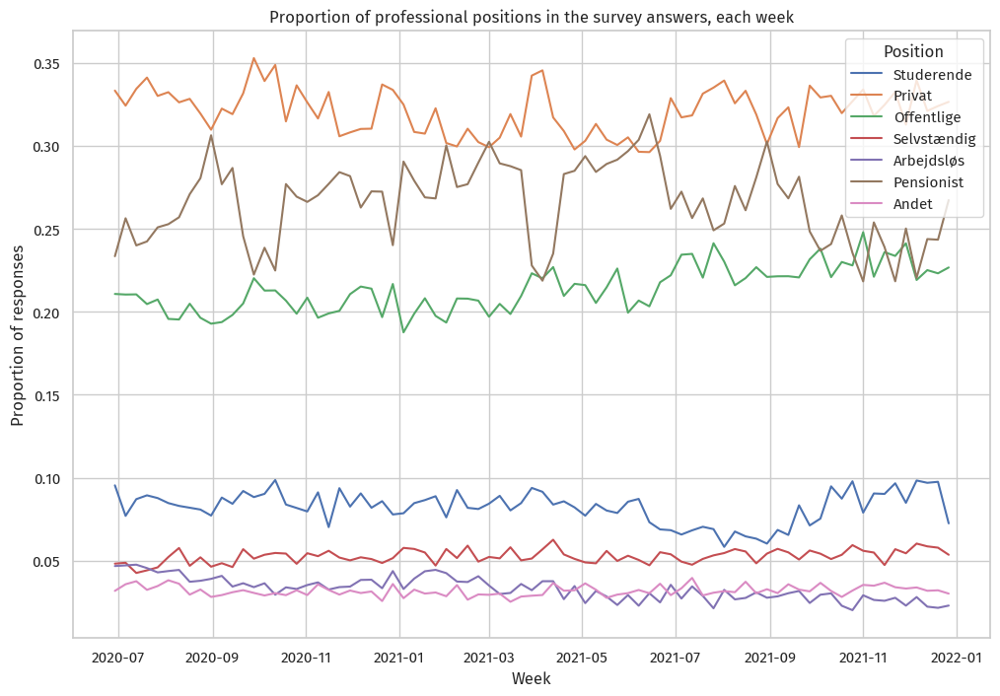

In [44]:
df['Position'] = df['Q14'].map({
    'Lønmodtager i en privat virksomhed': 'Privat',
    'Lønmodtager i det offentlige (stat, kommune eller region)': 'Offentlige',
    'Selvstændig': 'Selvstændig',
    'Under uddannelse': 'Studerende',
    'Arbejdsløs': 'Arbejdsløs',
    'Pensionist eller efterlønsmodtager': 'Pensionist',
    'Andet': 'Andet'
})

POSITION_ORDER = [
    'Studerende',
    'Privat',
    'Offentlige',
    'Selvstændig',
    'Arbejdsløs',
    'Pensionist',
    'Andet'
]

_, ax = plt.subplots(figsize=(12, 8))
sns.lineplot(
    data=(df.groupby(['Week', 'Position']).size() / df.groupby('Week')['Position'].count()).reset_index(), 
    x='Week', y=0, hue='Position',hue_order=POSITION_ORDER, ax=ax
).set(title='Proportion of professional positions in the survey answers, each week',
      ylabel='Proportion of responses')

plt.show()

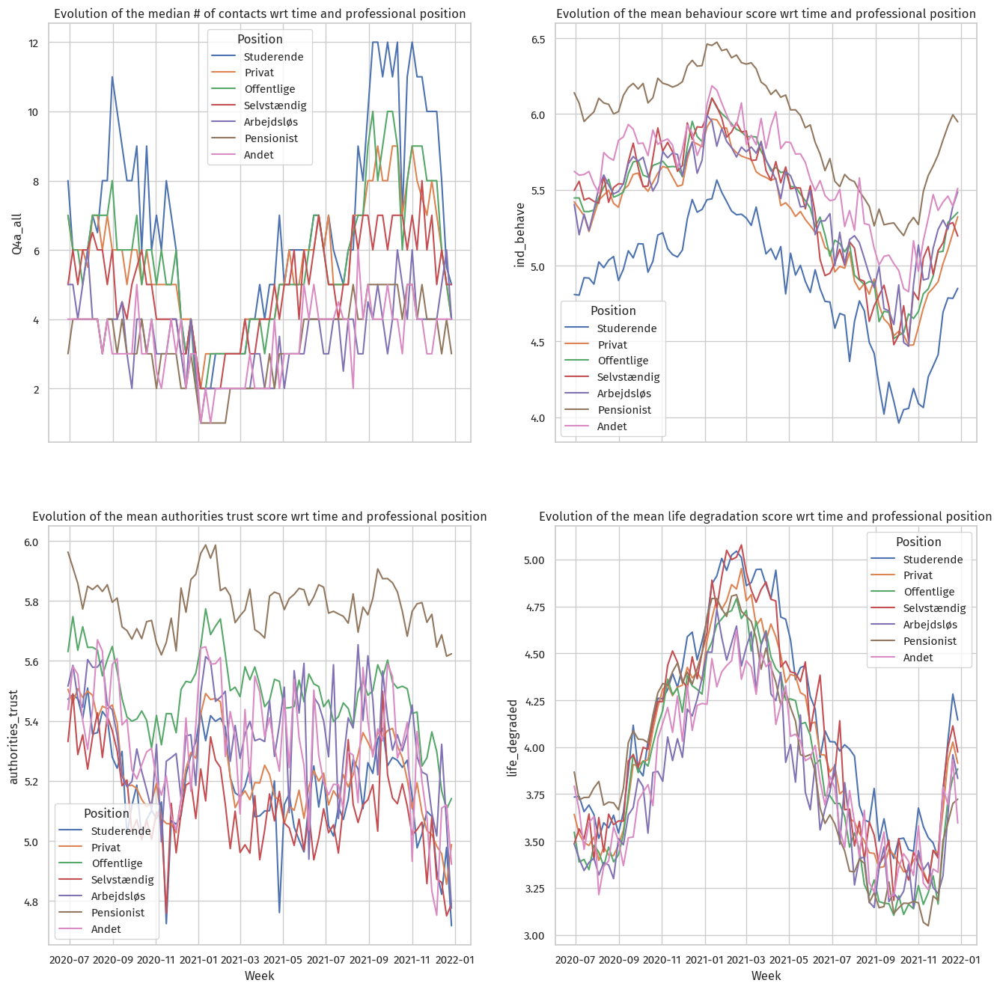

In [45]:
_, axs = plt.subplots(2, 2, figsize=(16, 16), sharex=True)

sns.lineplot(
    data=df, x='Week', y='Q4a_all', hue='Position',hue_order=POSITION_ORDER, estimator='median', errorbar=None, ax=axs[0][0]
).set(title='Evolution of the median # of contacts wrt time and professional position')

sns.lineplot(
    data=df, x='Week', y='ind_behave', hue='Position',hue_order=POSITION_ORDER, estimator='mean', errorbar=None, ax=axs[0][1]
).set(title='Evolution of the mean behaviour score wrt time and professional position')

sns.lineplot(
    data=df, x='Week', y='authorities_trust', hue='Position',hue_order=POSITION_ORDER, estimator='mean', errorbar=None, ax=axs[1][0]
).set(title='Evolution of the mean authorities trust score wrt time and professional position')

sns.lineplot(
    data=df, x='Week', y='life_degraded', hue='Position',hue_order=POSITION_ORDER, estimator='mean', errorbar=None, ax=axs[1][1]
).set(title='Evolution of the mean life degradation score wrt time and professional position')

plt.show()

<Axes: xlabel='Position', ylabel='aldercat'>

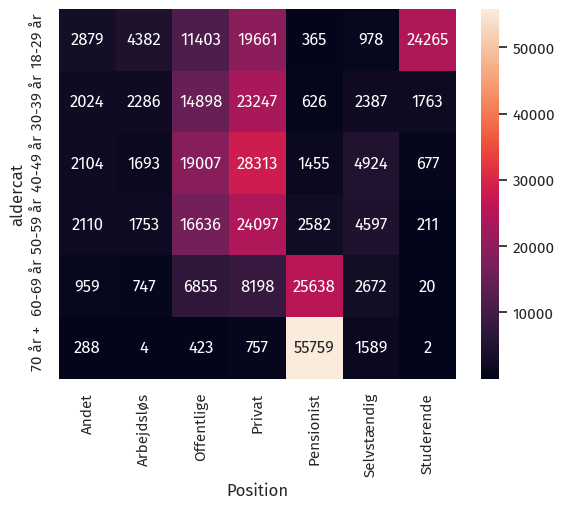

In [46]:
sns.heatmap(
    df.groupby(['aldercat', 'Position'], as_index=False).size()\
    .pivot(columns='Position', index='aldercat', values='size'),
    annot=True, fmt='d'
)

## Analysis using NMF

In [47]:
from sklearn.decomposition import NMF

QUESTIONS = ['Q1_1', 'Q1_2'] + \
           [f'Q2_{i}' for i in range(1, 7)] + \
           [f'Q3_{i}' for i in range(1, 8)] + \
           [f'Q4a_{i}' for i in range(1, 5)] + \
           [f'Q5_{i}' for i in range(1, 6)] + \
           [f'Q6_{i}' for i in range(1, 10)] + \
           [f'Q7_{i}' for i in range(1, 6)]
    
df_red = df[QUESTIONS + ['Week', 'Day']].dropna(axis=0).copy()
for f in QUESTIONS:
    df_red[f] = df_red[f].rank(pct=True)

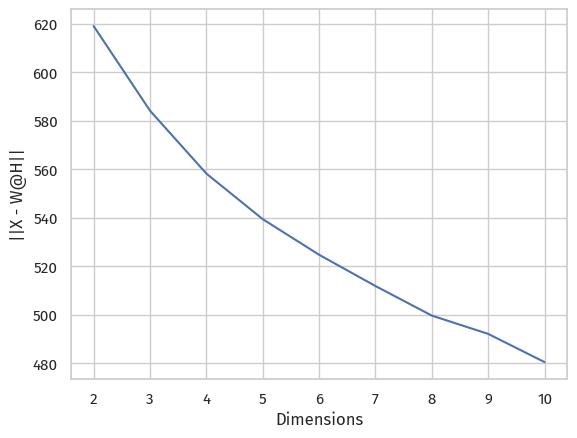

In [48]:
# Selecting the number of dimensions
from numpy.linalg import norm

res = pd.DataFrame(columns=['Dimensions', '||X - W@H||'])
X = df_red.drop(['Week', 'Day'], axis=1).values

for i in range(2, 11):
    nmf = NMF(i, max_iter=1024, alpha_W=2e-3, alpha_H=1e-1)
    W = nmf.fit_transform(X)
    H = nmf.components_

    res.loc[len(res)] = (i, norm(X - W@H))
    
sns.lineplot(res, x='Dimensions', y='||X - W@H||')
plt.show()

Shape of X: (200027, 38)
Shape of W: (200027, 5)
Shape of H: (5, 38)
Sample weights example:


array([[0.10557006, 1.64855356, 0.        , 0.16537439, 1.47780219],
       [0.27124879, 0.99397224, 1.54716889, 0.33825297, 1.86649927],
       [1.01730991, 1.19818042, 1.23871852, 0.45553383, 1.50950826],
       [1.49616224, 0.78775847, 0.58873303, 1.21608598, 0.42888406],
       [0.        , 1.7968428 , 1.54006454, 0.2196766 , 1.13733439],
       [1.42454102, 1.25223402, 0.77159633, 0.        , 1.65497241],
       [0.83302064, 1.1933222 , 1.34514368, 0.35982869, 1.07658456],
       [0.60491479, 0.8503114 , 0.36929503, 1.93797997, 0.82292892],
       [0.41343731, 1.33546155, 0.9961257 , 0.1342253 , 1.16057082],
       [0.51044234, 0.9187357 , 0.68562368, 0.73903471, 1.67324144],
       [0.5736441 , 1.65795597, 0.56127141, 0.79623633, 0.76670665],
       [1.02215626, 0.76817913, 1.43259886, 1.15125688, 0.        ],
       [1.53578988, 0.31808783, 0.90199707, 1.01255322, 0.83111475],
       [0.81209963, 0.97702749, 0.56889637, 1.35277244, 0.        ],
       [0.82054227, 1.31138719, 0.

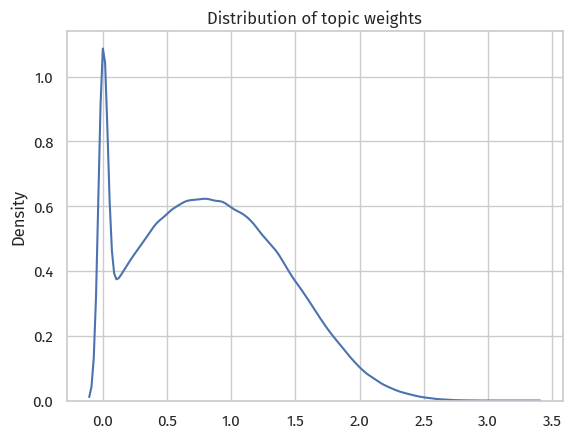

In [49]:
nmf = NMF(5, max_iter=1024, alpha_W=2e-3, alpha_H=1e-1)
W = nmf.fit_transform(X)
H = nmf.components_

print(f'Shape of X: {X.shape}')
print(f'Shape of W: {W.shape}')
print(f'Shape of H: {H.shape}')

print('Sample weights example:')
display(W[:20, :])

sns.kdeplot(W.flatten()).set(title='Distribution of topic weights')
plt.show()

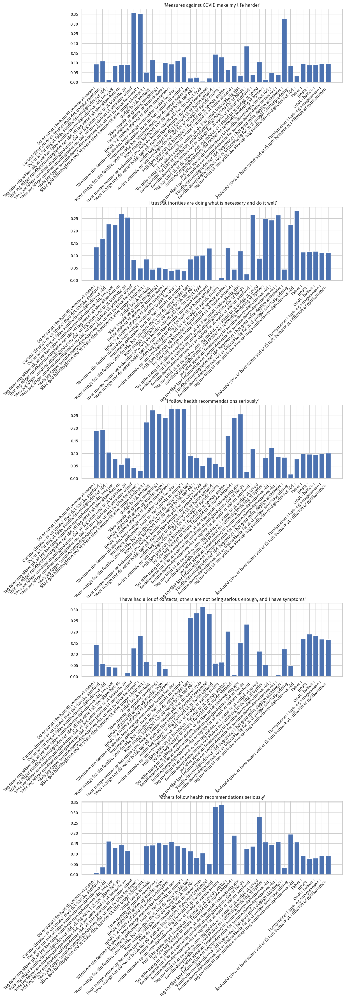

In [50]:
fig, axs = plt.subplots(H.shape[0], 1, figsize=(12, 8*H.shape[0]))

for i in range(H.shape[0]):
    axs[i].bar(range(H.shape[1]), height=H[i, :])
    axs[i].set_xticks(range(H.shape[1]), [QUESTIONS_META[f] for f in QUESTIONS], rotation=45, ha='right')
fig.subplots_adjust(hspace=1.70)

dimensions_labels = [
    "'Measures against COVID make my life harder'",
    "'I trust authorities are doing what is necessary and do it well'",
    "'I follow health recommendations seriously'",
    "'I have had a lot of contacts, others are not being serious enough, and I have symptoms'",
    "'Others follow health recommendations seriously'"
]

for i in range(len(dimensions_labels)):
    axs[i].set_title(dimensions_labels[i])

plt.show()

<Axes: >

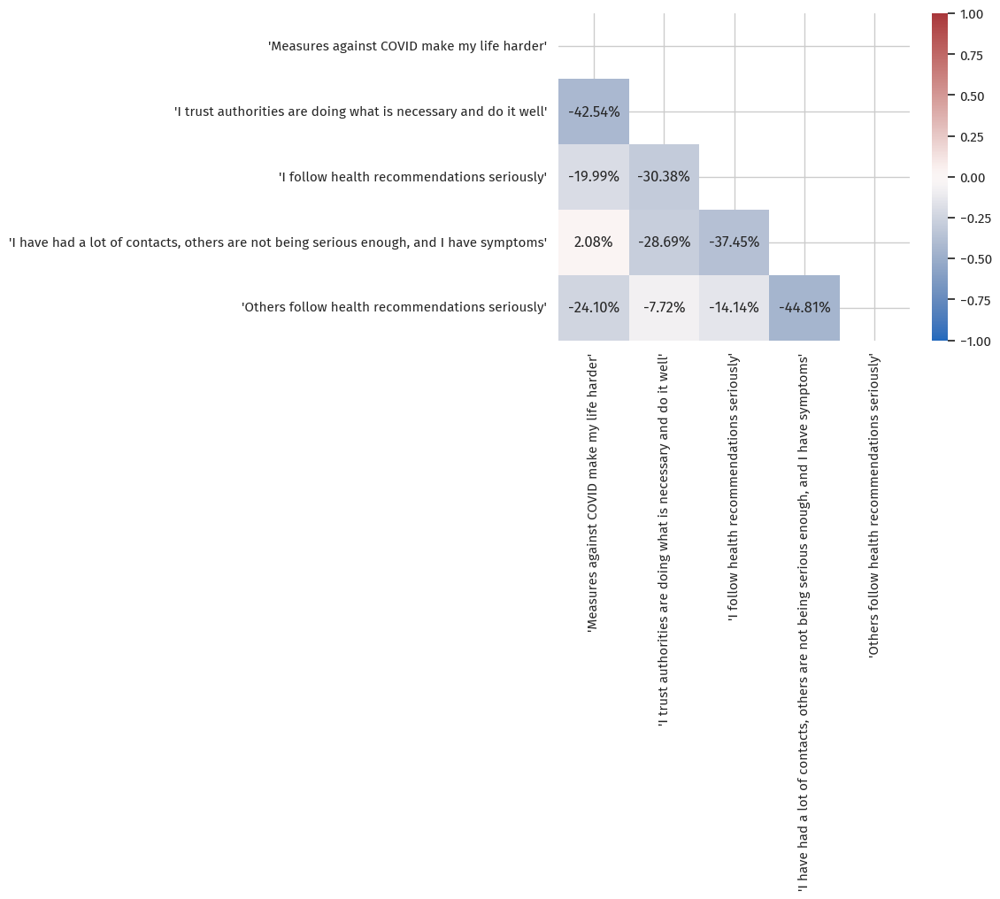

In [51]:
sns.heatmap(data=np.corrcoef(H), vmin=-1, vmax=1, cmap='vlag', annot=True, fmt='.2%', xticklabels=dimensions_labels, yticklabels=dimensions_labels, mask=np.triu(np.ones_like(np.corrcoef(H))))

### Further studying some correlations

#### What is the link between having lots of contacts, and trust in others doing their part?

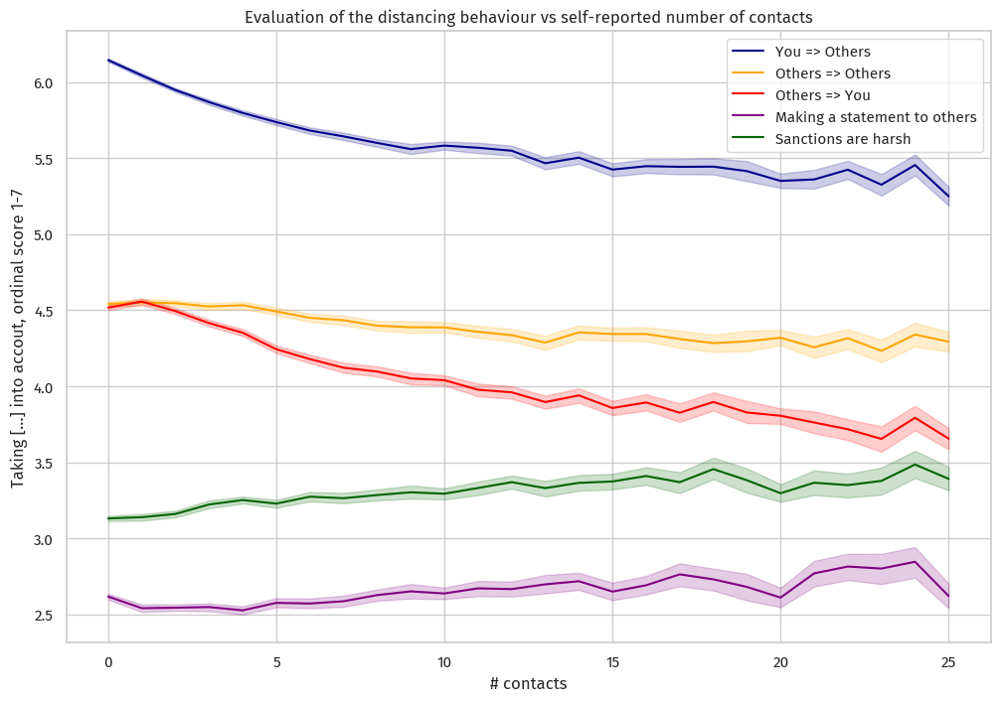

In [52]:
_, ax = plt.subplots(figsize=(12, 8))

tmp = df[(df['Q4a_all'] <= 25) & (df['Q4a_all'] >= 0)][['Q4a_all', 'Q5_1', 'Q5_2', 'Q5_3_inv', 'Q5_4', 'Q5_5', 'Q6_1']].astype('float')

sns.lineplot(
    data=tmp, x='Q4a_all', y='Q5_4', estimator='mean', errorbar=('ci', 95), label='You => Others', color='darkblue', ax=ax
).set(title='Evaluation of the distancing behaviour vs self-reported number of contacts', xlabel='# contacts', ylabel='Taking [...] into accout, ordinal score 1-7')

sns.lineplot(
    data=tmp, x='Q4a_all', y='Q5_3_inv', estimator='mean', errorbar=('ci', 95), label='Others => Others', color='orange', ax=ax
)

sns.lineplot(
    data=tmp, x='Q4a_all', y='Q5_1', estimator='mean', errorbar=('ci', 95), label='Others => You', color='red', ax=ax
)

sns.lineplot(
    data=tmp, x='Q4a_all', y='Q5_5', estimator='mean', errorbar=('ci', 95), label='Making a statement to others', color='purple', ax=ax
)

sns.lineplot(
    data=tmp, x='Q4a_all', y='Q6_1', estimator='mean', errorbar=('ci', 95), label='Sanctions are harsh', color='darkgreen', ax=ax
)

del tmp

plt.legend()
plt.show()

### Evolution of archetypes over time

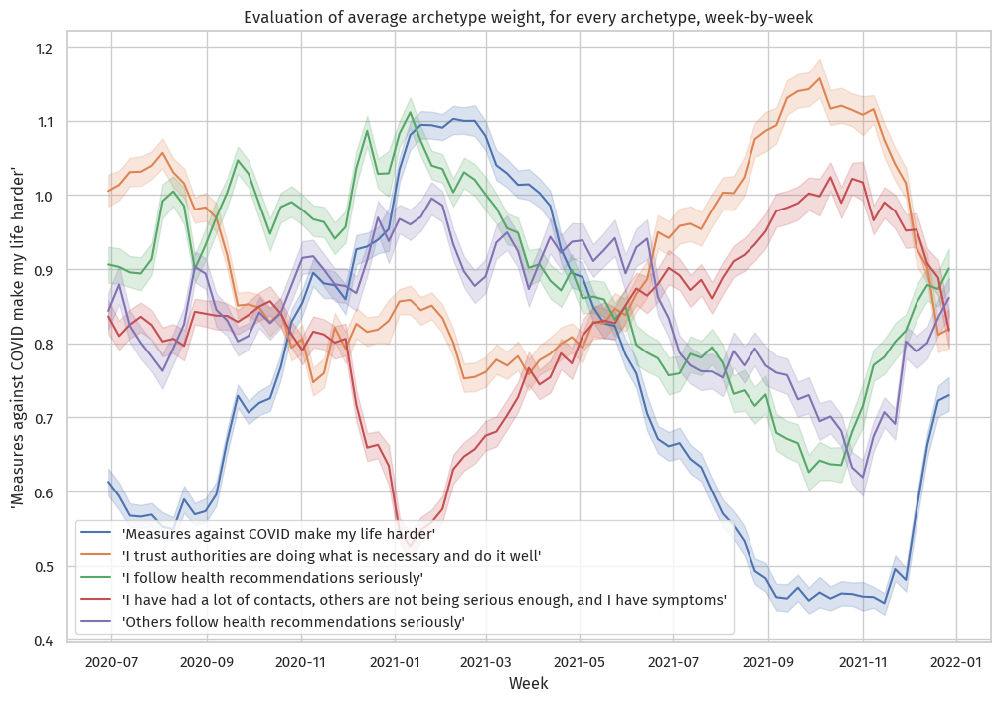

In [53]:
df_red[dimensions_labels] = W

_, ax = plt.subplots(figsize=(12, 8))

for f in dimensions_labels:
    sns.lineplot(
        data=df_red, x='Week', y=f, estimator='mean', errorbar=('ci', 95), label=f, ax=ax
    )

ax.set(title='Evaluation of average archetype weight, for every archetype, week-by-week')
    
plt.legend()
plt.show()

### Comparing archetypes with hand-crafted features

In [54]:
from sklearn.preprocessing import scale, minmax_scale, quantile_transform

#df_red[['ind_behave', 'authorities_trust', 'life_degraded', 'others_behave', 'randoms_behave']] = minmax_scale(df.loc[df_red.index, ['ind_behave', 'authorities_trust', 'life_degraded', 'others_behave', 'randoms_behave']])
df_red[['ind_behave', 'authorities_trust', 'life_degraded', 'others_behave', 'randoms_behave']] = scale(df.loc[df_red.index, ['ind_behave', 'authorities_trust', 'life_degraded', 'others_behave', 'randoms_behave']])
df_red[dimensions_labels] = scale(df_red[dimensions_labels])
df_red['Q4a_all'] = scale(quantile_transform(df.loc[df_red.index, 'Q4a_all'].values.reshape(-1, 1)))

df_obs = df_red[(df_red['Day'] >= '2020-07-01') & (df_red['Day'] < '2020-10-01')]

#### Individual behaviour score vs. NMF Dimension 3

Correlation between NMF and hand-crafted: 95.10%
Correlation between NMF and hand-crafted, differenciated: 82.98%


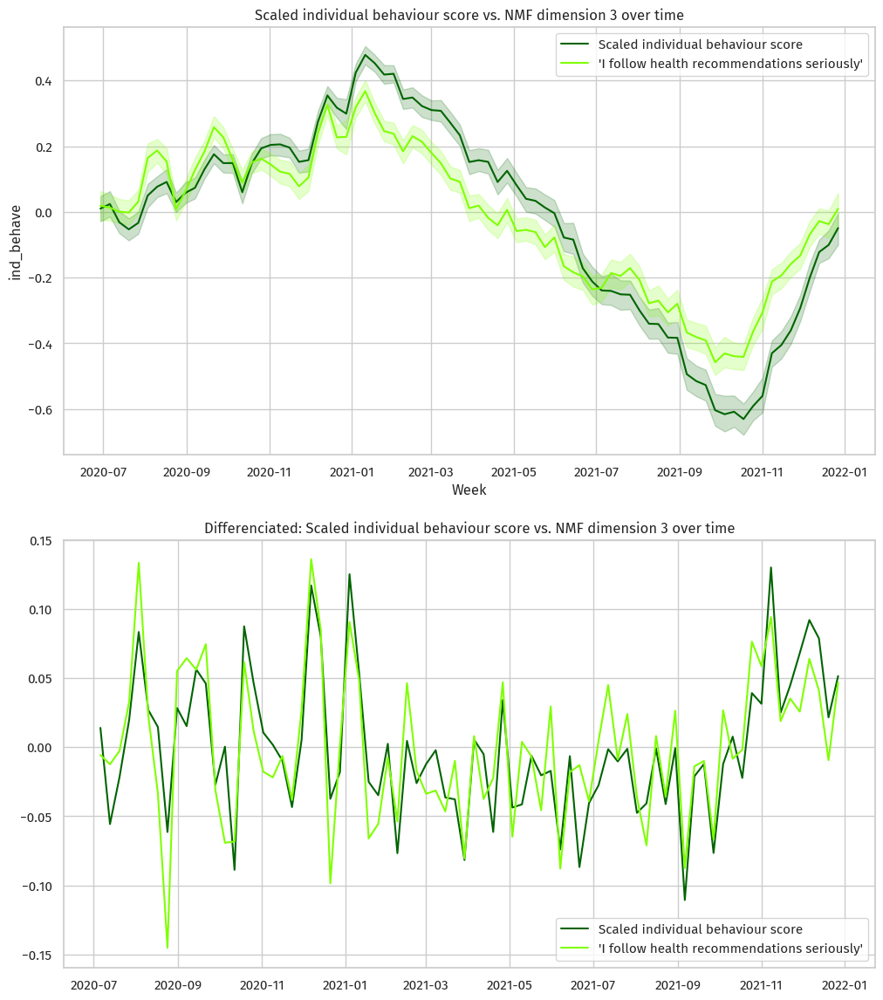

In [55]:
print('Correlation between NMF and hand-crafted: {:.2%}'.format(
    np.corrcoef(
        df_red.groupby('Week')['ind_behave'].mean().values,
        df_red.groupby('Week')["'I follow health recommendations seriously'"].mean().values
    )[0, 1]
))

print('Correlation between NMF and hand-crafted, differenciated: {:.2%}'.format(
    np.corrcoef(
        np.diff(df_red.groupby('Week')['ind_behave'].mean().values),
        np.diff(df_red.groupby('Week')["'I follow health recommendations seriously'"].mean().values)
    )[0, 1]
))

_, axs = plt.subplots(2, figsize=(12, 14))

hand = "ind_behave"
label = "Scaled individual behaviour score"
i = 2
color1 = 'darkgreen'
color2 = 'chartreuse'

# Standard

sns.lineplot(
    data=df_red, x='Week', y=hand, estimator='mean', errorbar=('ci', 95), label=label, color=color1, ax=axs[0]
)

sns.lineplot(
    data=df_red, x='Week', y=dimensions_labels[i], estimator='mean', errorbar=('ci', 95), label=dimensions_labels[i], color=color2, ax=axs[0]
)

axs[0].set(title=f'{label} vs. NMF dimension {i+1} over time')

# Differenciated

gb = df_red.groupby('Week')[hand].mean()
diff_h = np.diff(gb.values)
diff_n = np.diff(df_red.groupby('Week')[dimensions_labels[i]].mean().values)
xaxis  = gb.index.to_numpy()[1:]

sns.lineplot(x=xaxis, y=diff_h, label=label, color=color1, ax=axs[1])
sns.lineplot(x=xaxis, y=diff_n, label=dimensions_labels[i], color=color2, ax=axs[1])
   
axs[1].set(title=f'Differenciated: {label} vs. NMF dimension {i+1} over time')
    
plt.legend()
plt.show()

#### Authorities trust vs. NMF dimension 2

Correlation between NMF and hand-crafted: 34.95%
Correlation between NMF and hand-crafted, differenciated: 74.72%


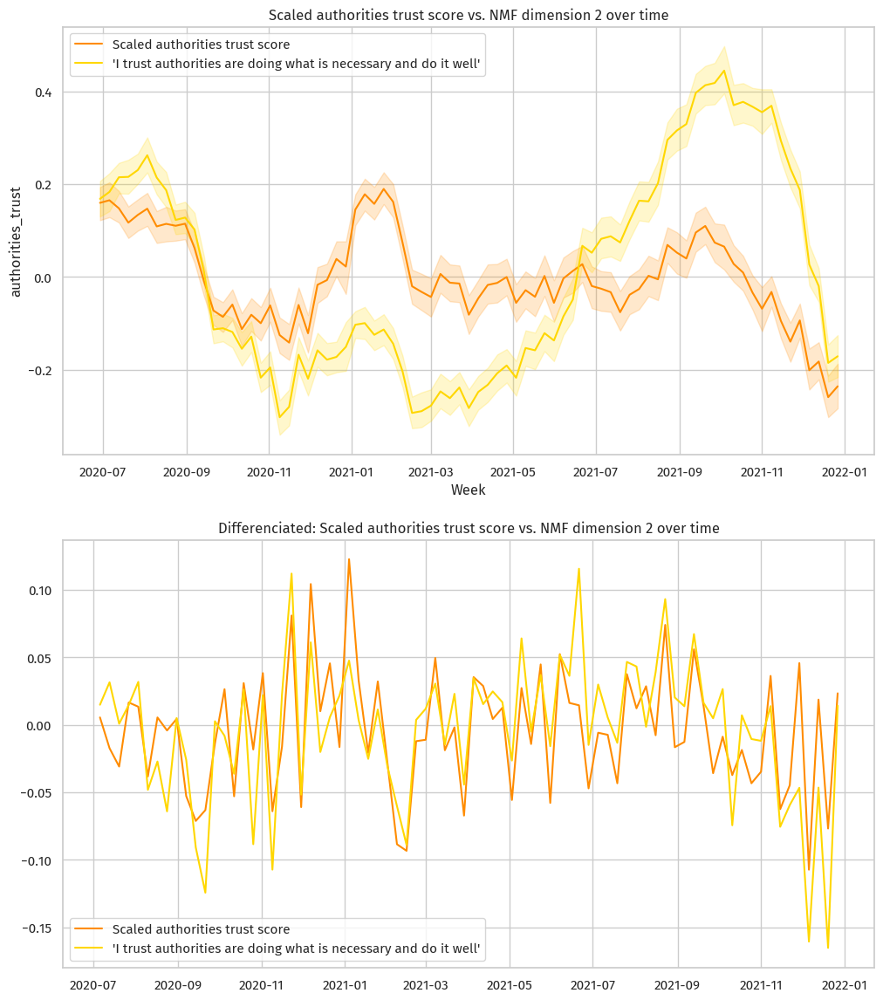

In [56]:
print('Correlation between NMF and hand-crafted: {:.2%}'.format(
    np.corrcoef(
        df_red.groupby('Week')['authorities_trust'].mean().values,
        df_red.groupby('Week')["'I trust authorities are doing what is necessary and do it well'"].mean().values
    )[0, 1]
))

print('Correlation between NMF and hand-crafted, differenciated: {:.2%}'.format(
    np.corrcoef(
        np.diff(df_red.groupby('Week')['authorities_trust'].mean().values),
        np.diff(df_red.groupby('Week')["'I trust authorities are doing what is necessary and do it well'"].mean().values)
    )[0, 1]
))

_, axs = plt.subplots(2, figsize=(12, 14))

hand = "authorities_trust"
label = "Scaled authorities trust score"
i = 1
color1 = 'darkorange'
color2 = 'gold'

# Standard

sns.lineplot(
    data=df_red, x='Week', y=hand, estimator='mean', errorbar=('ci', 95), label=label, color=color1, ax=axs[0]
)

sns.lineplot(
    data=df_red, x='Week', y=dimensions_labels[i], estimator='mean', errorbar=('ci', 95), label=dimensions_labels[i], color=color2, ax=axs[0]
)

axs[0].set(title=f'{label} vs. NMF dimension {i+1} over time')

# Differenciated

gb = df_red.groupby('Week')[hand].mean()
diff_h = np.diff(gb.values)
diff_n = np.diff(df_red.groupby('Week')[dimensions_labels[i]].mean().values)
xaxis  = gb.index.to_numpy()[1:]

sns.lineplot(x=xaxis, y=diff_h, label=label, color=color1, ax=axs[1])
sns.lineplot(x=xaxis, y=diff_n, label=dimensions_labels[i], color=color2, ax=axs[1])
   
axs[1].set(title=f'Differenciated: {label} vs. NMF dimension {i+1} over time')
    
plt.legend()
plt.show()

#### Life degradation vs NMF dimension 1

Correlation between NMF and hand-crafted: 99.76%
Correlation between NMF and hand-crafted, differenciated: 94.34%


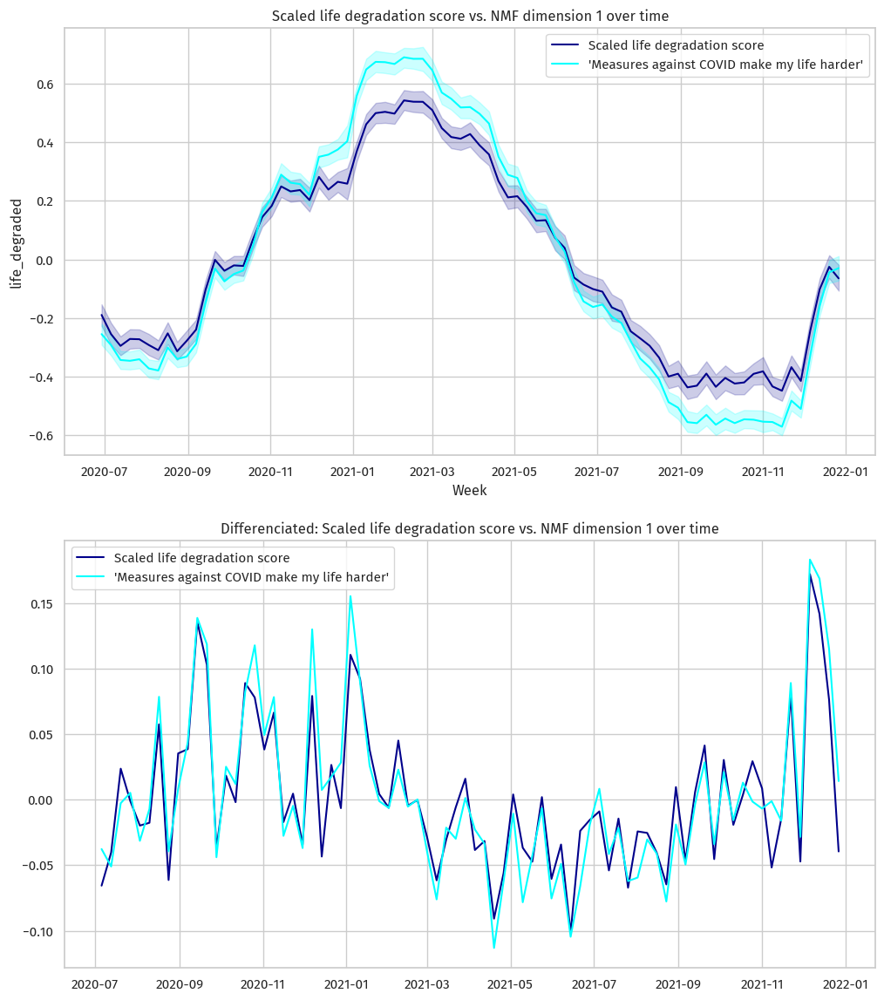

In [57]:
print('Correlation between NMF and hand-crafted: {:.2%}'.format(
    np.corrcoef(
        df_red.groupby('Week')['life_degraded'].mean().values,
        df_red.groupby('Week')["'Measures against COVID make my life harder'"].mean().values
    )[0, 1]
))

print('Correlation between NMF and hand-crafted, differenciated: {:.2%}'.format(
    np.corrcoef(
        np.diff(df_red.groupby('Week')['life_degraded'].mean().values),
        np.diff(df_red.groupby('Week')["'Measures against COVID make my life harder'"].mean().values)
    )[0, 1]
))

_, axs = plt.subplots(2, figsize=(12, 14))

hand = "life_degraded"
label = "Scaled life degradation score"
i = 0
color1 = 'darkblue'
color2 = 'cyan'

# Standard

sns.lineplot(
    data=df_red, x='Week', y=hand, estimator='mean', errorbar=('ci', 95), label=label, color=color1, ax=axs[0]
)

sns.lineplot(
    data=df_red, x='Week', y=dimensions_labels[i], estimator='mean', errorbar=('ci', 95), label=dimensions_labels[i], color=color2, ax=axs[0]
)

axs[0].set(title=f'{label} vs. NMF dimension {i+1} over time')

# Differenciated

gb = df_red.groupby('Week')[hand].mean()
diff_h = np.diff(gb.values)
diff_n = np.diff(df_red.groupby('Week')[dimensions_labels[i]].mean().values)
xaxis  = gb.index.to_numpy()[1:]

sns.lineplot(x=xaxis, y=diff_h, label=label, color=color1, ax=axs[1])
sns.lineplot(x=xaxis, y=diff_n, label=dimensions_labels[i], color=color2, ax=axs[1])
   
axs[1].set(title=f'Differenciated: {label} vs. NMF dimension {i+1} over time')
    
plt.legend()
plt.show()

#### Number of contacts vs NMF dimension 4

Correlation between NMF and hand-crafted: 94.37%
Correlation between NMF and hand-crafted, differenciated: 57.39%


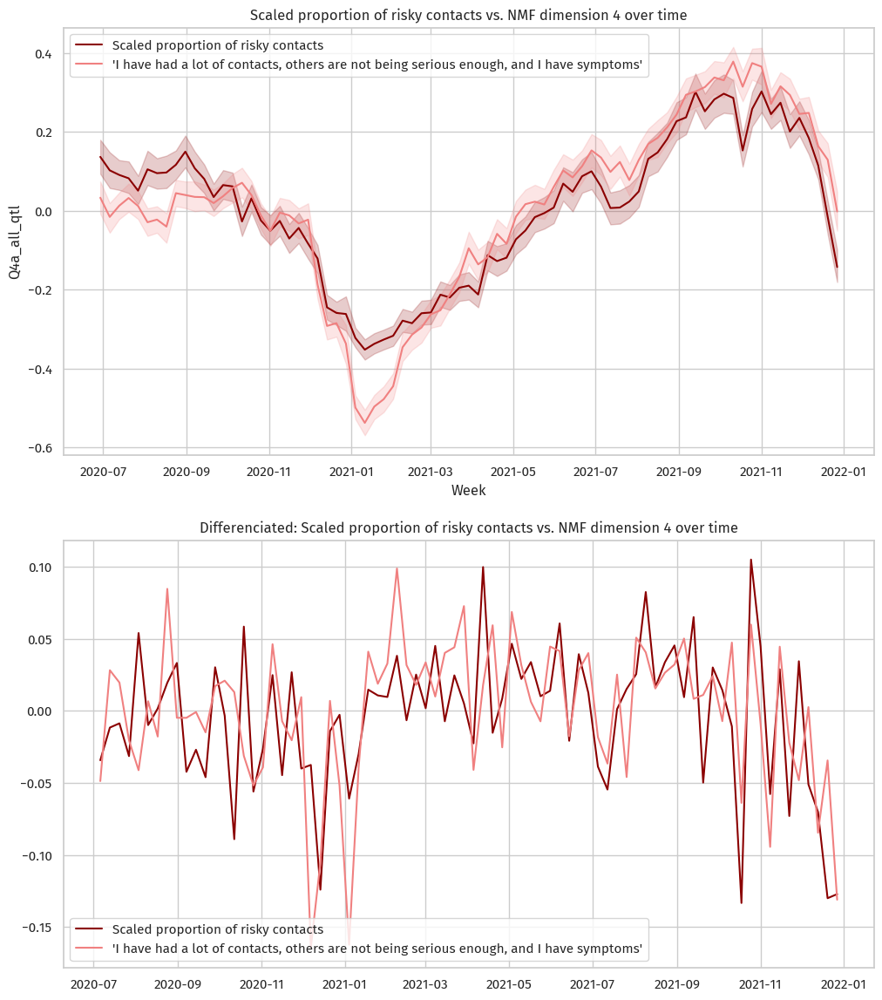

In [58]:
df_red['Q4a_all_qtl'] = scale((df_red['Q4a_all'] > np.quantile(df_obs['Q4a_all'], 0.7)).astype('int'))

print('Correlation between NMF and hand-crafted: {:.2%}'.format(
    np.corrcoef(
        df_red.groupby('Week')['Q4a_all_qtl'].mean().values,
        df_red.groupby('Week')["'I have had a lot of contacts, others are not being serious enough, and I have symptoms'"].mean().values
    )[0, 1]
))

print('Correlation between NMF and hand-crafted, differenciated: {:.2%}'.format(
    np.corrcoef(
        np.diff(df_red.groupby('Week')['Q4a_all_qtl'].mean().values),
        np.diff(df_red.groupby('Week')["'I have had a lot of contacts, others are not being serious enough, and I have symptoms'"].mean().values)
    )[0, 1]
))

_, axs = plt.subplots(2, figsize=(12, 14))

hand = "Q4a_all_qtl"
label = "Scaled proportion of risky contacts"
i = 3
color1 = 'darkred'
color2 = 'lightcoral'

# Standard

sns.lineplot(
    data=df_red, x='Week', y=hand, estimator='mean', errorbar=('ci', 95), label=label, color=color1, ax=axs[0]
)

sns.lineplot(
    data=df_red, x='Week', y=dimensions_labels[i], estimator='mean', errorbar=('ci', 95), label=dimensions_labels[i], color=color2, ax=axs[0]
)

axs[0].set(title=f'{label} vs. NMF dimension {i+1} over time')

# Differenciated

gb = df_red.groupby('Week')[hand].mean()
diff_h = np.diff(gb.values)
diff_n = np.diff(df_red.groupby('Week')[dimensions_labels[i]].mean().values)
xaxis  = gb.index.to_numpy()[1:]

sns.lineplot(x=xaxis, y=diff_h, label=label, color=color1, ax=axs[1])
sns.lineplot(x=xaxis, y=diff_n, label=dimensions_labels[i], color=color2, ax=axs[1])
   
axs[1].set(title=f'Differenciated: {label} vs. NMF dimension {i+1} over time')
    
plt.legend()
plt.show()

#### Others behaviour score vs. NMF dimension 5

Correlation between NMF and hand-crafted: 95.80%
Correlation between NMF and hand-crafted, differenciated: 91.84%


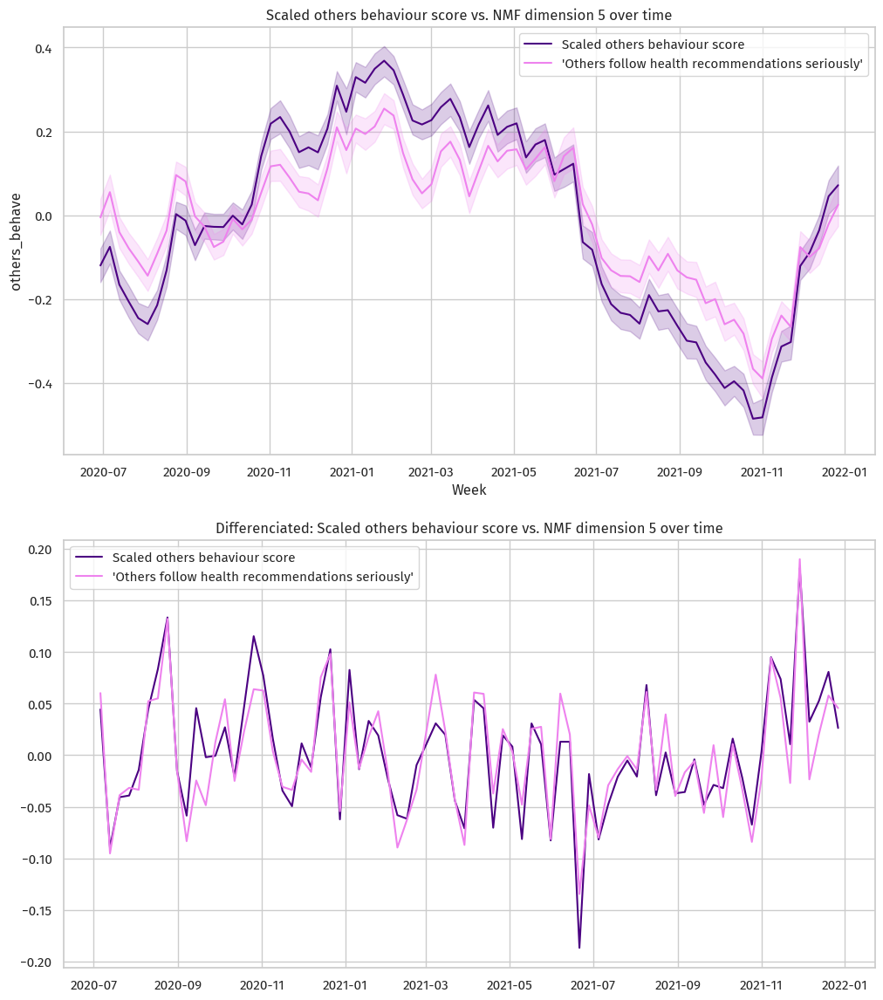

In [59]:
print('Correlation between NMF and hand-crafted: {:.2%}'.format(
    np.corrcoef(
        df_red.groupby('Week')['others_behave'].mean().values,
        df_red.groupby('Week')["'Others follow health recommendations seriously'"].mean().values
    )[0, 1]
))

print('Correlation between NMF and hand-crafted, differenciated: {:.2%}'.format(
    np.corrcoef(
        np.diff(df_red.groupby('Week')['others_behave'].mean().values),
        np.diff(df_red.groupby('Week')["'Others follow health recommendations seriously'"].mean().values)
    )[0, 1]
))

_, axs = plt.subplots(2, figsize=(12, 14))

hand = "others_behave"
label = "Scaled others behaviour score"
i = 4
color1 = 'indigo'
color2 = 'violet'

# Standard

sns.lineplot(
    data=df_red, x='Week', y=hand, estimator='mean', errorbar=('ci', 95), label=label, color=color1, ax=axs[0]
)

sns.lineplot(
    data=df_red, x='Week', y=dimensions_labels[i], estimator='mean', errorbar=('ci', 95), label=dimensions_labels[i], color=color2, ax=axs[0]
)

axs[0].set(title=f'{label} vs. NMF dimension {i+1} over time')

# Differenciated

gb = df_red.groupby('Week')[hand].mean()
diff_h = np.diff(gb.values)
diff_n = np.diff(df_red.groupby('Week')[dimensions_labels[i]].mean().values)
xaxis  = gb.index.to_numpy()[1:]

sns.lineplot(x=xaxis, y=diff_h, label=label, color=color1, ax=axs[1])
sns.lineplot(x=xaxis, y=diff_n, label=dimensions_labels[i], color=color2, ax=axs[1])
   
axs[1].set(title=f'Differenciated: {label} vs. NMF dimension {i+1} over time')
    
plt.legend()
plt.show()

### Evolution of archetypes wrt socio-demographic features

In [60]:
df_red[['aldercat', 'Education', 'Position']] = df.loc[df_red.index, ['aldercat', 'Education', 'Position']]

#### Age

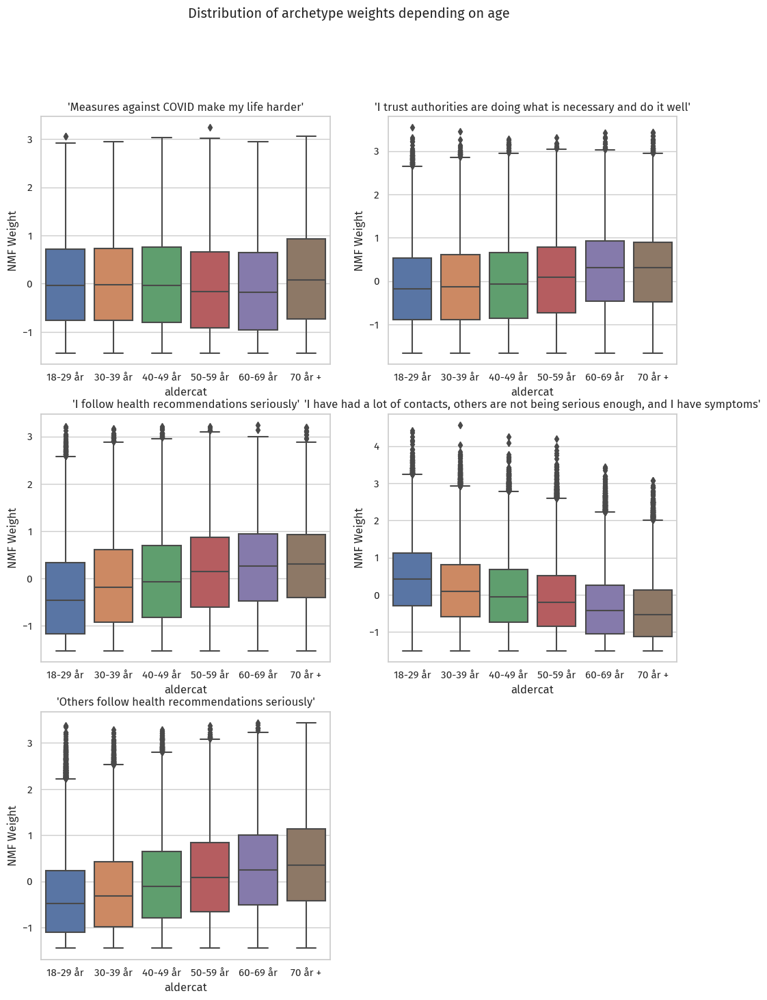

In [61]:
fig, axs = plt.subplots(3, 2, figsize=(12, 16))

for l, label in enumerate(dimensions_labels):
    ax = axs[l//2][l%2]
    
    sns.boxplot(df_red, x='aldercat', y=label, order=ALDER_ORDER, ax=ax)
    ax.set(title=label, ylabel='NMF Weight')
    
fig.delaxes(axs[2][1])
    
plt.suptitle('Distribution of archetype weights depending on age')
plt.show()

#### Education

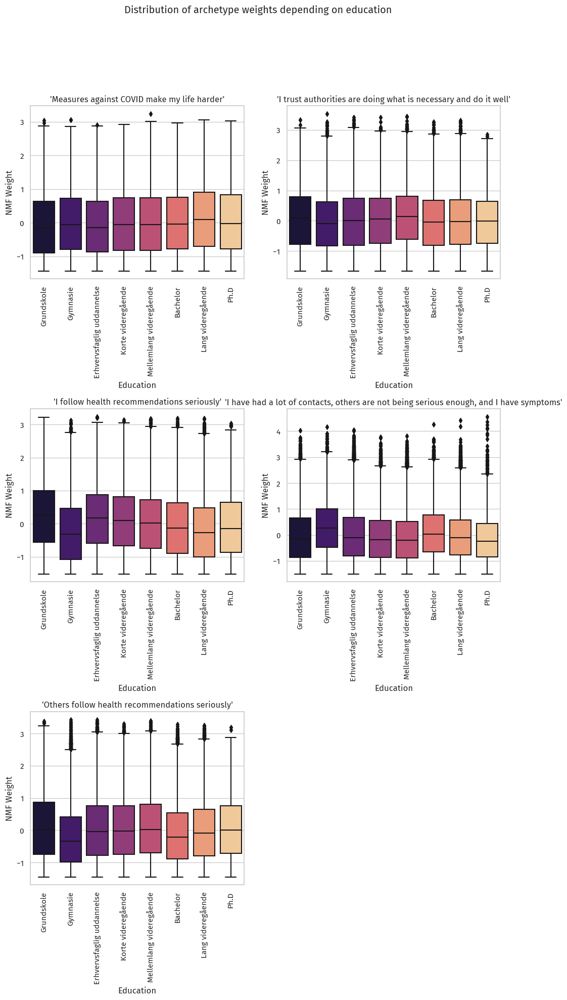

In [62]:
fig, axs = plt.subplots(3, 2, figsize=(12, 20))

for l, label in enumerate(dimensions_labels):
    ax = axs[l//2][l%2]
    
    sns.boxplot(df_red, x='Education', y=label, order=EDUCATION_ORDER, palette=EDUCATION_PALETTE, ax=ax)
    ax.set(title=label, ylabel='NMF Weight')
    
    ax.tick_params(axis='x', labelrotation = 90)
    
plt.suptitle('Distribution of archetype weights depending on education')
fig.subplots_adjust(hspace=0.75)
fig.delaxes(axs[2][1])
plt.show()

#### Position

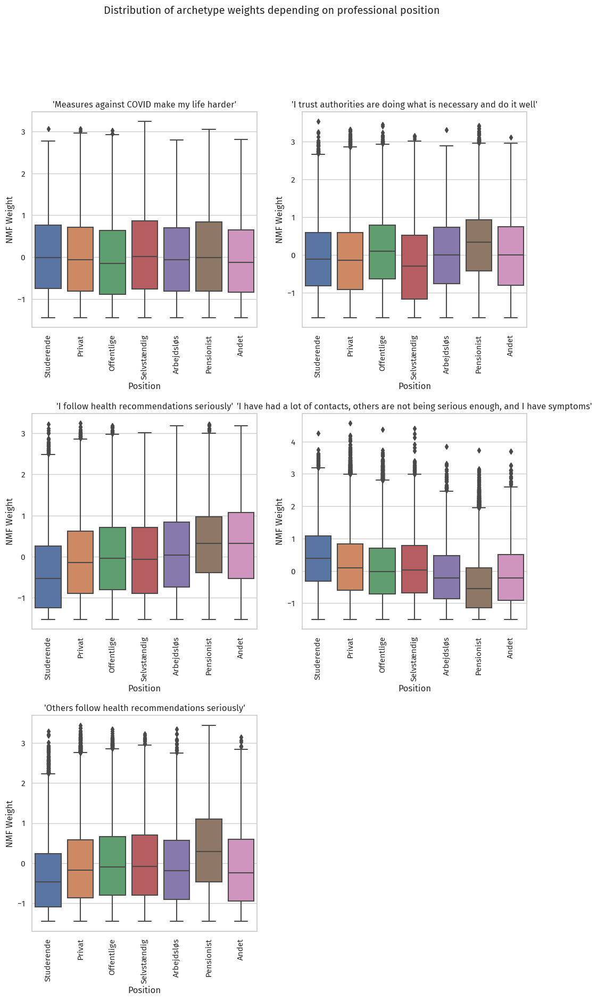

In [63]:
fig, axs = plt.subplots(3, 2, figsize=(12, 20))

for l, label in enumerate(dimensions_labels):
    ax = axs[l//2][l%2]
    
    sns.boxplot(df_red, x='Position', y=label, order=POSITION_ORDER, ax=ax)
    ax.set(title=label, ylabel='NMF Weight')
    
    ax.tick_params(axis='x', labelrotation = 90)
    
plt.suptitle('Distribution of archetype weights depending on professional position')
fig.subplots_adjust(hspace=0.40)
fig.delaxes(axs[2][1])
plt.show()

## Studying contacts & contact types in more details

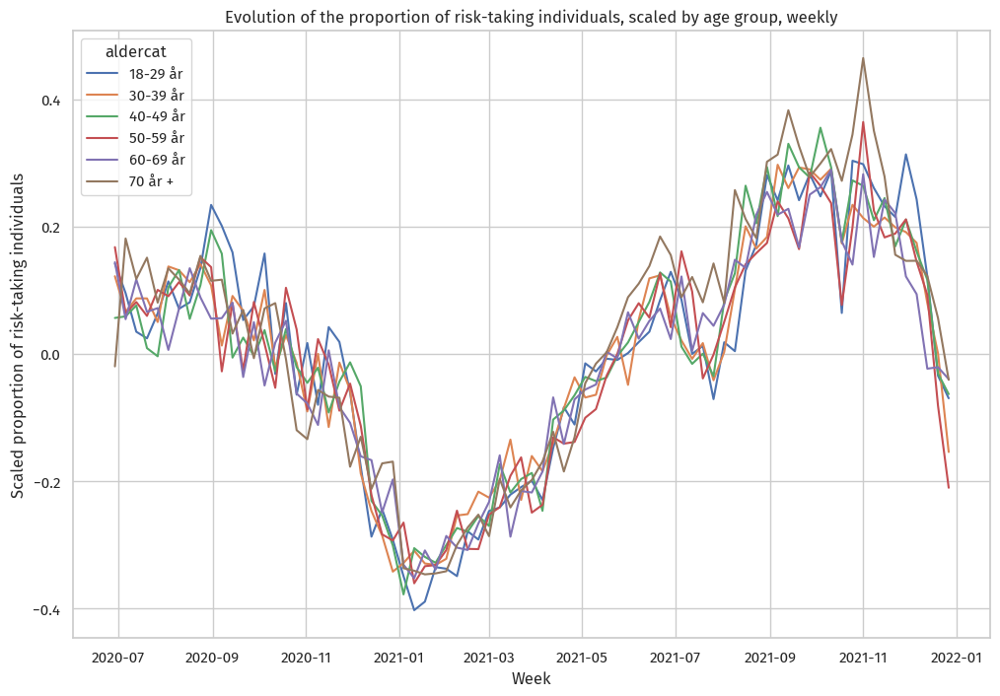

In [64]:
_, ax = plt.subplots(figsize=(12, 8))

for cat in ALDER_ORDER:
    df.loc[df['aldercat'] == cat, 'at_risk_60_scaled'] = scale(df.loc[df['aldercat'] == cat, 'at_risk_60'])
    df.loc[df['aldercat'] == cat, 'at_risk_70_scaled'] = scale(df.loc[df['aldercat'] == cat, 'at_risk_70'])
    df.loc[df['aldercat'] == cat, 'at_risk_80_scaled'] = scale(df.loc[df['aldercat'] == cat, 'at_risk_80'])
    df.loc[df['aldercat'] == cat, 'at_risk_90_scaled'] = scale(df.loc[df['aldercat'] == cat, 'at_risk_90'])

sns.lineplot(
    data=df, x='Week', y='at_risk_70_scaled', estimator='mean', hue='aldercat', hue_order=ALDER_ORDER, errorbar=None, ax=ax
).set(ylabel='Scaled proportion of risk-taking individuals', title='Evolution of the proportion of risk-taking individuals, scaled by age group, weekly')

plt.show()

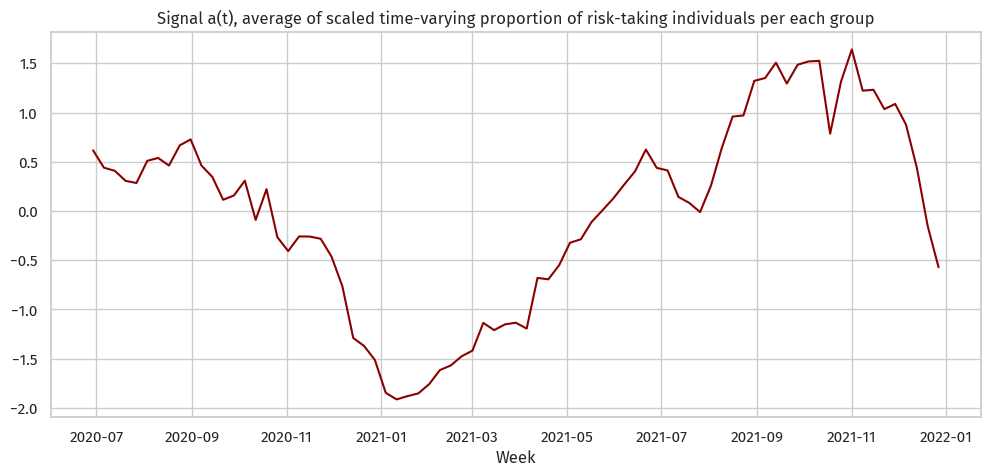

In [65]:
x_t = df.groupby(['Week', 'aldercat'])['at_risk_70'].mean()\
        .reset_index().pivot(index='aldercat', columns='Week', values='at_risk_70')

idx = x_t.columns

M = x_t.mean(axis=1).values.reshape(-1, 1)
S = x_t.std(axis=1).values.reshape(-1, 1)

a_t = (x_t.values - M) * (1/S)

w = df.groupby(['Week', 'aldercat'])['at_risk_70'].count()\
      .reset_index().pivot(index='aldercat', columns='Week', values='at_risk_70')

a_t = np.average(a_t, axis=0, weights=w)

_, ax = plt.subplots(figsize=(12, 5))

sns.lineplot(x=idx, y=a_t, color='darkred', ax=ax).set(title='Signal a(t), average of scaled time-varying proportion of risk-taking individuals per each group')

plt.show()

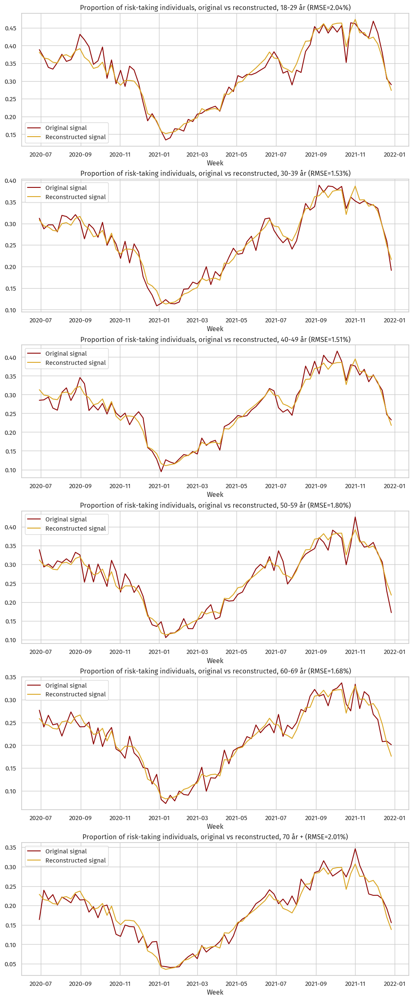

In [66]:
from sklearn.metrics import mean_squared_error as mse

r_t = S @ a_t.reshape(1, -1) + M

A = len(ALDER_ORDER)
fig, axs = plt.subplots(A, 1, figsize=(12, 5*A))

for i in range(A):
    sns.lineplot(x=idx, y=x_t.values[i], label='Original signal', color='darkred', ax=axs[i])
    sns.lineplot(x=idx, y=r_t[i], label='Reconstructed signal', color='goldenrod', ax=axs[i])
    
    rmse = np.sqrt(mse(x_t.values[i], r_t[i]))
    
    axs[i].set(title=f'Proportion of risk-taking individuals, original vs reconstructed, {ALDER_ORDER[i]} (RMSE={rmse:.2%})')
    
fig.subplots_adjust(hspace=0.25)
    
plt.legend()
plt.show()

In [67]:
M

array([[0.32534704],
       [0.26043932],
       [0.26377481],
       [0.26349605],
       [0.2157489 ],
       [0.18176656]])

In [68]:
S

array([[0.09053405],
       [0.0769819 ],
       [0.08004938],
       [0.07836962],
       [0.06973529],
       [0.07629371]])

In [69]:
thrs = [60, 70, 80, 90]

res = pd.DataFrame(columns=['Thr_Percentile', 'Agegroup', 'M', 'S'])

for thr in thrs:
    x_t = df.groupby(['Week', 'aldercat'])[f'at_risk_{thr}'].mean()\
            .reset_index().pivot(index='aldercat', columns='Week', values=f'at_risk_{thr}')

    idx = x_t.columns

    M = x_t.mean(axis=1).values.reshape(-1, 1)
    S = x_t.std(axis=1).values.reshape(-1, 1)
    
    for a, alder in enumerate(ALDER_ORDER):
        res.loc[len(res)] = (thr, alder, M[a][0], S[a][0])

res.to_csv('some_m_and_s_values.csv')
res

,Thr_Percentile,Agegroup,M,S
0,60,18-29 år,0.410843,0.099472
1,60,30-39 år,0.337950,0.088083
2,60,40-49 år,0.340639,0.091913
3,60,50-59 år,0.340716,0.087190
4,60,60-69 år,0.290218,0.080673
5,60,70 år +,0.249811,0.087431
6,70,18-29 år,0.325347,0.090534
7,70,30-39 år,0.260439,0.076982
8,70,40-49 år,0.263775,0.080049
9,70,50-59 år,0.263496,0.078370


## Doing the same, with individual behaviour

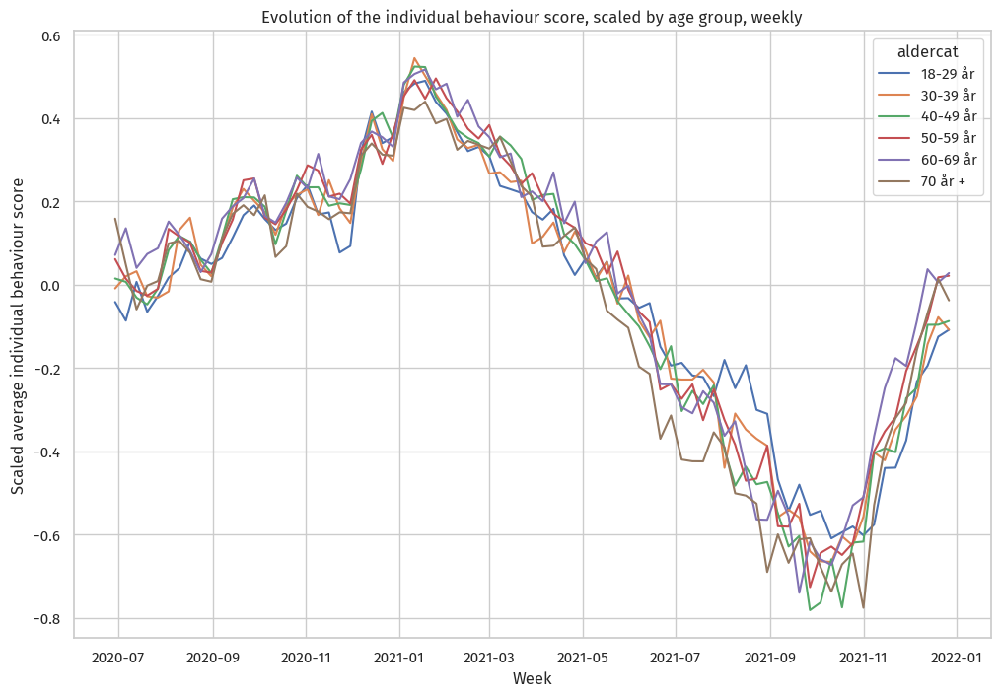

In [70]:
_, ax = plt.subplots(figsize=(12, 8))

for cat in ALDER_ORDER:
    df.loc[df['aldercat'] == cat, 'ind_behave_scaled'] = scale(df.loc[df['aldercat'] == cat, 'ind_behave'])

sns.lineplot(
    data=df, x='Week', y='ind_behave_scaled', estimator='mean', hue='aldercat', hue_order=ALDER_ORDER, errorbar=None, ax=ax
).set(ylabel='Scaled average individual behaviour score', title='Evolution of the individual behaviour score, scaled by age group, weekly')

plt.show()

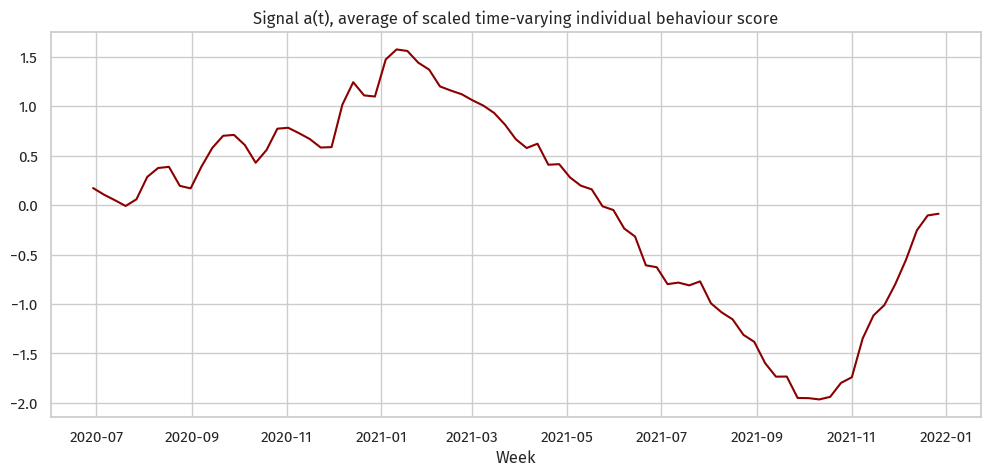

In [71]:
x_t = df.groupby(['Week', 'aldercat'])['ind_behave'].mean()\
        .reset_index().pivot(index='aldercat', columns='Week', values='ind_behave')

idx = x_t.columns

M = x_t.mean(axis=1).values.reshape(-1, 1)
S = x_t.std(axis=1).values.reshape(-1, 1)

a_t = (x_t.values - M) * (1/S)

w = df.groupby(['Week', 'aldercat'])['ind_behave'].count()\
      .reset_index().pivot(index='aldercat', columns='Week', values='ind_behave')

a_t = np.average(a_t, axis=0, weights=w)

_, ax = plt.subplots(figsize=(12, 5))

sns.lineplot(x=idx, y=a_t, color='darkred', ax=ax).set(title='Signal a(t), average of scaled time-varying individual behaviour score')

plt.show()

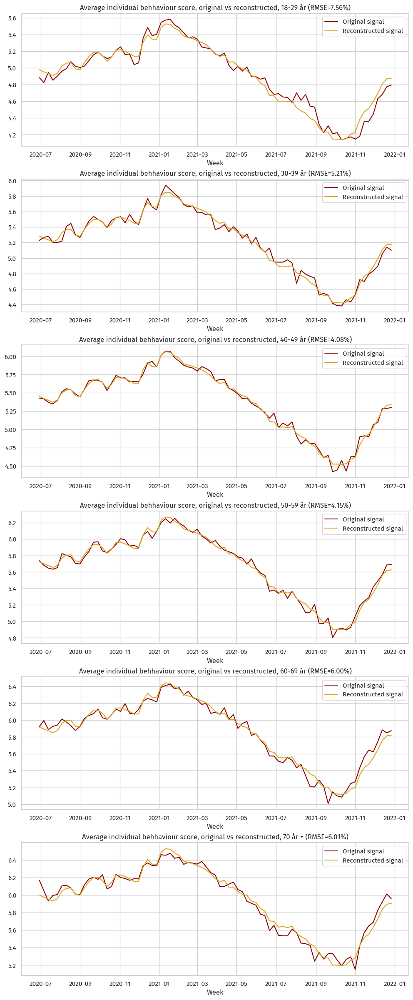

In [72]:
from sklearn.metrics import mean_squared_error as mse

r_t = S @ a_t.reshape(1, -1) + M

A = len(ALDER_ORDER)
fig, axs = plt.subplots(A, 1, figsize=(12, 5*A))

for i in range(A):
    sns.lineplot(x=idx, y=x_t.values[i], label='Original signal', color='darkred', ax=axs[i])
    sns.lineplot(x=idx, y=r_t[i], label='Reconstructed signal', color='goldenrod', ax=axs[i])
    
    rmse = np.sqrt(mse(x_t.values[i], r_t[i]))
    
    axs[i].set(title=f'Average individual behhaviour score, original vs reconstructed, {ALDER_ORDER[i]} (RMSE={rmse:.2%})')
    
fig.subplots_adjust(hspace=0.25)
    
plt.legend()
plt.show()

In [73]:
M

array([[4.91037878],
       [5.21333166],
       [5.37616973],
       [5.65932792],
       [5.85327629],
       [5.93566839]])

In [74]:
S

array([[0.39131611],
       [0.40383605],
       [0.43495891],
       [0.38668146],
       [0.37422099],
       [0.37672274]])

## Checking other features

In [75]:
df.head()

,udsendt,Timings_dateFirstEntry,Timings_dateLastEntry,Timings_dateFinish,Timings_timeTotalMinutes,koen,aldernum,aldercat,postnr,kommune,kommune_aktuel,region,Q1_1,Q1_2,Q2_1,Q2_2,Q2_3,Q2_4,Q2_5,Q2_6,Q3_1,Q3_2,Q3_3,Q3_4,Q3_5,Q3_6,Q3_7,Q4a_1,Q4a_2,Q4a_3,Q4a_4,Q4b_1,Q4b_2,Q4b_3,Q4b_4,Q5_1,Q5_2,Q5_3,Q5_4,Q5_5,Q6_1,Q6_2,Q6_3,Q6_4,Q6_5,Q6_6,Q6_7,Q6_8,Q6_9,Q7_1,Q7_2,Q7_3,Q7_4,Q7_5,Ny1,Q2020NovNy1,Q2020NovNy2,Q2020NovNy3,Q2020NovNy4,Q2021FebNy1,Q2021DecNy1,Q2021DecNy2,Q10,Q11,Q12,Q14,Q15,Q16,DagVej,UgeVej,weight,antal_påbegyndt,antal_vaccinerede,population,Day,Week,Month,Year,Q4a_all,Q4b_all,at_risk_60,at_risk_70,at_risk_80,at_risk_90,ind_behave,Q5_3_inv,others_behave,randoms_behave,authorities_trust,life_degraded,Parti2019,Education,Position,at_risk_60_scaled,at_risk_70_scaled,at_risk_80_scaled,at_risk_90_scaled,ind_behave_scaled
orgpid,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
172AS766,2020-06-30,2020-06-30,2020-06-30,2020-07-01,22,Mand,23,18-29 år,2800.0,159 Gladsaxe,159 Gladsaxe,Hovedstaden,5,2,6,7,7,7,2,1,4,3,5,2,3,1,3,0,0,0,0,<NA>,<NA>,<NA>,<NA>,5,6,2,7,1,1,7,5,4,7,7,1,6,6,False,False,False,False,False,NaN,<NA>,NaN,<NA>,NaN,NaN,NaN,NaN,Bachelor (fx 1. del af en lang videregående ud...,1 person,Jeg har ingen hjemmeboende børn,Under uddannelse,V: Venstre,V: Venstre,1.465850,0.496362,0.578246,NaN,NaN,NaN,2020-07-01,2020-06-29,2020-07-01,2020-01-01,0,<NA>,False,False,False,False,3.000000,6,5.50,6.0,6.6,1.333333,Venstre,Bachelor,Studerende,-0.830049,-0.689657,-0.526429,-0.360967,-1.473754
510ZS590,2020-06-26,2020-07-01,2020-07-01,2020-07-01,9,Mand,45,40-49 år,2791.0,185 Tårnby,185 Tårnby,Hovedstaden,4,7,7,7,7,7,2,2,7,7,7,7,7,7,7,0,2,4,0,<NA>,2,0,<NA>,6,7,2,7,4,3,7,5,5,5,5,2,7,7,False,False,False,False,False,NaN,<NA>,NaN,<NA>,NaN,NaN,NaN,NaN,"Erhvervsfaglig uddannelse (fx tømrer, frisør e...",2 personer,2 børn,Lønmodtager i en privat virksomhed,A: Socialdemokratiet,A: Socialdemokratiet,1.099070,2.623457,2.359034,NaN,NaN,NaN,2020-07-01,2020-06-29,2020-07-01,2020-01-01,6,<NA>,False,False,False,False,7.000000,6,6.00,6.5,7.0,2.000000,Socialdemokratiet,Erhvervsfaglig uddannelse,Privat,-0.712529,-0.593067,-0.456660,-0.311487,1.259751
469AT275,2020-07-01,2020-07-01,2020-07-01,2020-07-01,9,Kvinde,47,40-49 år,8400.0,706 Syddjurs,706 Syddjurs,Midtjylland,3,5,7,7,6,7,5,6,7,7,6,7,6,7,7,3,0,1,10,3,<NA>,0,0,6,6,2,7,5,1,7,6,6,7,7,5,6,6,False,False,False,False,False,NaN,<NA>,NaN,<NA>,NaN,NaN,NaN,NaN,Bachelor (fx 1. del af en lang videregående ud...,4 personer,2 børn,Lønmodtager i en privat virksomhed,V: Venstre,A: Socialdemokratiet,1.038313,0.816161,0.925886,NaN,NaN,NaN,2020-07-01,2020-06-29,2020-07-01,2020-01-01,14,<NA>,True,True,False,False,6.714286,6,6.00,6.0,6.4,5.333333,Venstre,Bachelor,Privat,1.403452,1.686149,-0.456660,-0.311487,1.033444
332BS168,2020-06-14,2020-07-01,2020-07-01,2020-07-01,6,Kvinde,57,50-59 år,2770.0,185 Tårnby,185 Tårnby,Hovedstaden,4,5,7,7,7,7,7,7,6,5,6,6,4,5,5,0,3,0,10,<NA>,0,<NA>,5,5,6,3,5,6,3,4,4,3,4,4,5,4,3,False,False,True,False,False,NaN,<NA>,NaN,<NA>,NaN,NaN,NaN,NaN,Korte videregående (fx laborant eller datamati...,1 person,Jeg har ingen hjemmeboende børn,Lønmodtager i en privat virksomhed,A: Socialdemokratiet,I tvivl om partivalg,0.940539,0.280390,0.394033,NaN,NaN,NaN,2020-07-01,2020-06-29,2020-07-01,2020-01-01,13,<NA>,True,True,False,False,5.285714,5,5.00,5.5,5.0,6.333333,Socialdemokratiet,Korte videregående,Privat,1.386554,1.664857,-0.457539,-0.310937,-0.319123
190CT408,2020-07-01,2020-07-01,2020-07-01,2020-07-01,7,Kvinde,55,50-59 år,5000.0,461 Odense,461 Odense,Syddanmark,7,7,7,7,7,7,1,1,7,6,7,6,7,7,6,1,2,0,0,0,1,<NA>,<NA>,5,5,4,5,6,1,7,5,6,7,7,1,6,7,False,False,False,False,False,NaN,<NA>,NaN,<NA>,NaN,NaN,NaN,NaN,Mellemlang videregående (fx teknikum ingeniør ...,3 personer,1 barn,"Lønmodtager i det offentlige (stat, kommune el...",A: Socialdemokratiet,A: Socialdemokratiet,0.918438,0.251420,0.335737,NaN,NaN,NaN,2020-07-01,2020-06-29,2020-07-01,2020-01-01,3,<NA>

In [76]:
from sklearn.metrics import r2_score

res = pd.DataFrame(columns=ALDER_ORDER)

for feature in ['at_risk_70', 'ind_behave', 'authorities_trust', 'life_degraded', 'others_behave']:
    x_t = df.groupby(['Week', 'aldercat'])[feature].mean()\
        .reset_index().pivot(index='aldercat', columns='Week', values=feature)

    idx = x_t.columns

    M = x_t.mean(axis=1).values.reshape(-1, 1)
    S = x_t.std(axis=1).values.reshape(-1, 1)

    a_t = (x_t.values - M) * (1/S)

    w = df.groupby(['Week', 'aldercat'])[feature].count()\
          .reset_index().pivot(index='aldercat', columns='Week', values=feature)

    a_t = np.average(a_t, axis=0, weights=w)
    
    r_t = S @ a_t.reshape(1, -1) + M

    A = len(ALDER_ORDER)
    
    rmse = [r2_score(x_t.values[i], r_t[i]) for i in range(A)]
    
    res.loc[feature] = rmse
    
res

,18-29 år,30-39 år,40-49 år,50-59 år,60-69 år,70 år +
at_risk_70,0.948509,0.959749,0.963773,0.946593,0.941392,0.929980
ind_behave,0.962158,0.983164,0.991068,0.988329,0.973941,0.974203
authorities_trust,0.854769,0.852133,0.884999,0.810228,0.623866,0.656068
life_degraded,0.949476,0.958057,0.980697,0.983810,0.962588,0.907883
others_behave,0.968225,0.967636,0.972932,0.981974,0.960880,0.958062


## Causal analysis

Since effects of occupation seem so strong, we want to analyse whether age directly affects our different scores, or only as a causal ancestor to occupation.

To do so, we analyse the effect of age in every occupational category, and assess whether it statistically significantly influences the outcome variable.

In [83]:
# Crafting features

df['N_Contacts'] = df['Q4a_1'] + df['Q4a_2'] + df['Q4a_3'] + df['Q4a_4']
df['Individual_Behaviour'] = df[[f'Q3_{i}' for i in range(1, 8)]].astype('double').mean(axis=1)
df['Q5_3_inv'] = df['Q5_3'].max() + 1 - df['Q5_3']
df['Others_Behaviour'] = (df['Q5_1'] + df['Q5_2'] + df['Q5_3_inv'] + df['Q6_3']).astype('double')/4
df['Randoms_Behaviour'] = (df['Q5_2'] + df['Q5_3_inv']).astype('double')/2
df['Authorities_Trust'] = (df['Q2_3'] + df['Q2_4'] + df['Q6_2'] + df['Q6_8'] + df['Q6_9']).astype('double')/5
df['Life_Degraded'] = (df['Q2_5'] + df['Q2_6'] + df['Q6_7']).astype('double')/3

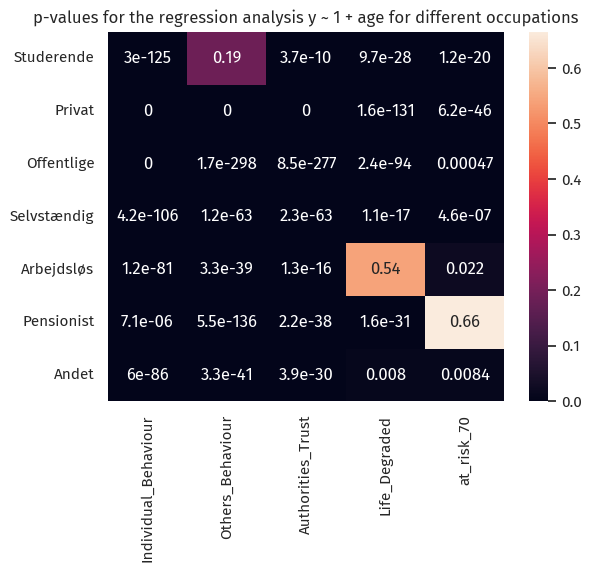

In [84]:
import statsmodels.api as sm

FEATURES = ['Individual_Behaviour', 'Others_Behaviour', 'Authorities_Trust', 'Life_Degraded', 'at_risk_70']

res = pd.DataFrame(columns=FEATURES)

for position in POSITION_ORDER:
    df_tmp = df[df['Position'] == position].dropna(subset=FEATURES).copy()
    df_tmp['alder'] = scale(df_tmp['aldernum'])
    
    p_vals = list()
    
    for feature in FEATURES:
        X = scale(df_tmp['aldernum'])
        y = df_tmp[feature].astype('float')
        X = pd.DataFrame(index=y.index, data=sm.add_constant(X), columns=('Intercept', 'Age'), dtype='float')
        
        p_vals.append(sm.OLS(y, X).fit().pvalues[1])
        
    res.loc[position] = p_vals
    
sns.heatmap(res, annot=True).set(title='p-values for the regression analysis y ~ 1 + age for different occupations')
plt.show()

Independently of position, age remains strongly correlated in nearly every case.

<Axes: xlabel='Position', ylabel='aldercat'>

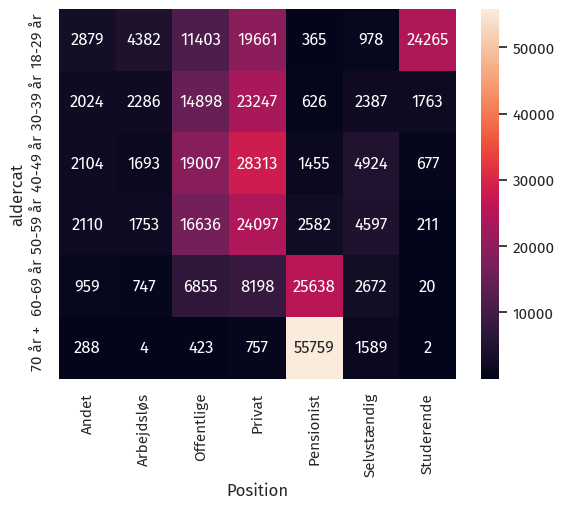

In [85]:
MIN_SAMPLES_TO_DRAW_CURVE = 2**11

sns.heatmap(
    df.groupby(['aldercat', 'Position'], as_index=False).size()\
    .pivot(columns='Position', index='aldercat', values='size'),
    annot=True, fmt='d'
)

### Individual behaviour

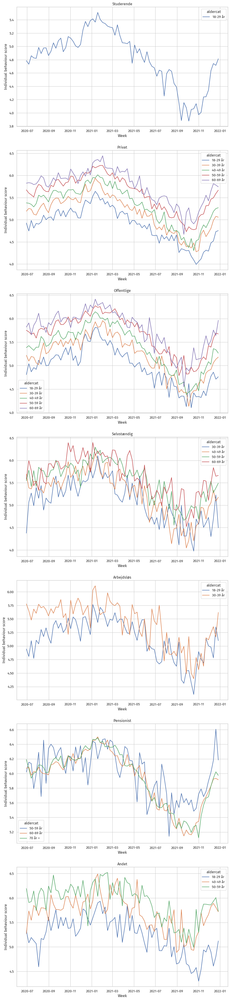

In [86]:
_, axs = plt.subplots(len(POSITION_ORDER), 1, figsize=(12, 8*len(POSITION_ORDER)))

for p, position in enumerate(POSITION_ORDER):
    df_tmp = df[df['Position'] == position]
    size = df_tmp.groupby('aldercat').size() >= MIN_SAMPLES_TO_DRAW_CURVE
    alder_order = size[size].index.to_list()
    
    sns.lineplot(
        data=df_tmp, x='Week', y='Individual_Behaviour', estimator='mean', hue='aldercat', hue_order=alder_order, errorbar=None, ax=axs[p]
    ).set(ylabel='Individual behaviour score', title=position)
    
plt.show()

### Contacts

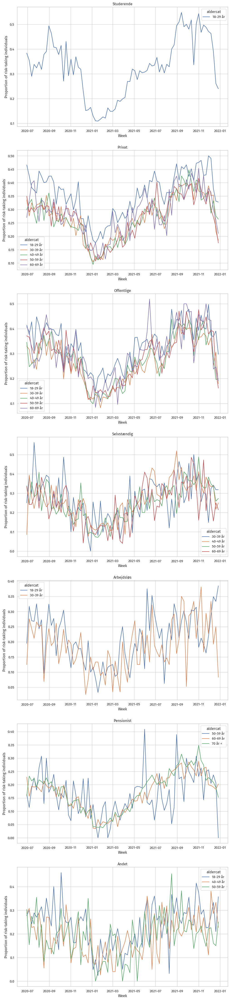

In [87]:
_, axs = plt.subplots(len(POSITION_ORDER), 1, figsize=(12, 8*len(POSITION_ORDER)))

for p, position in enumerate(POSITION_ORDER):
    df_tmp = df[df['Position'] == position]
    size = df_tmp.groupby('aldercat').size() >= MIN_SAMPLES_TO_DRAW_CURVE
    alder_order = size[size].index.to_list()
    
    sns.lineplot(
        data=df_tmp, x='Week', y='at_risk_70', estimator='mean', hue='aldercat', hue_order=alder_order, errorbar=None, ax=axs[p]
    ).set(ylabel='Proportion of risk-taking individuals', title=position)
    
plt.show()